# Part 2- Exploratory Data Analysis

---

West Nile virus (WNV) is the leading cause of mosquito-borne disease in the US, and it is spread to people by the bite of an infected mosquito, specifically a Culex pipiens mosquito. One in five infected people with WNV would experience fever, nausea, headache and muscle aches lasting from a few days to a few weeks - while the remaining four out of five would not exhibit any symptoms. To date, the virus remains a major concern as individuals with weaker immune systems and those above 60 are at higher risk for severe illness from WNV - raking up medical costs and creating more burden in the healthcare system. 

Every year the Chicago Department of Public Health (CDPH) runs a comprehensive surveillance program in suburban areas to trap mosquitoes and test them for WNV. This data has helped CDPH target high-risk areas for the virus and significantly reduce the number of positive cases in the last few years. ([source](https://www.chicago.gov/content/dam/city/depts/cdph/statistics_and_reports/CDInfo_2013_JULY_WNV.pdf))

However in 2021, Chicago was ranked one of the top five US cities with mosquitoes - putting its residents at risk of contracting WNV. ([source](https://www.fox32chicago.com/news/chicago-to-spray-insecticide-to-protect-against-west-nile-virus)). Furthermore in the last two years, much of the public efforts and funding were focused on keeping the city safe from COVID-19. Now, ahead of the looming recession and tightening of budgets ([source](https://www.economist.com/the-world-ahead/2022/11/18/why-a-global-recession-is-inevitable-in-2023)), the CDPH recognized an urgency to plan ahead and be prudent about spending. 

Our team at the Disease and Treatment Agency was tasked to analyze the years with more severe WNV outbreak and devise a plan to identify potential hotspots, ahead of the 2023 summer period.

## Problem Statement
To build a model with more than **70% recall** to predict the period and location where mosquitoes will test positive for WNV, enabling CDPH to preemptively allocate the city’s spraying resources to curb the virus transmission.

## Content

1. [Exploratory Data Analysis](#Exploratory-Data-Analysis)

## Links to Other Notebooks

- [Part 1: Data Cleaning](Part_1_WNV_Cleaning.ipynb)
- [Part 3: Modeling & Tuning](Part_3_WNV_Modeling.ipynb)
- [Part 4: Cost-Benefit Analysis & Conclusion](Part_4_WNV_CBA_Conclusion.ipynb)

### Libraries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import math

from datetime import datetime, time
from sklearn.neighbors import KernelDensity

#Ignore warnings
import warnings
warnings.filterwarnings("ignore")

#change display options
pd.set_option("display.max_rows", 160)
pd.set_option("display.max_columns", 80)
sns.set_theme(style="ticks", palette="Paired")

### Load datasets

In [3]:
df_merged = pd.read_csv('../assets/df_merge_prefinal.csv')
df_spray = pd.read_csv('../assets/spray.csv')
train_df = pd.read_csv('../assets/train.csv')
mapdata = np.loadtxt("../assets/mapdata_copyright_openstreetmap_contributors.txt")
#df = pd.read_csv('../assets/df_merge_prefinal.csv')
#spray = pd.read_csv('../assets/spray.csv')


In [4]:
# to check the conversion of 'Date' to index
df_merged.head()

,Date,Species,Trap,Latitude,Longitude,AddressAccuracy,NumMosquitos,WnvPresent,Year,Month,Week,DayOfWeek,Station,Tmax,Tmin,Tavg,Depart,DewPoint,WetBulb,Heat,Cool,Sunrise,Sunset,CodeSum,SnowFall,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed,Sunrise_1,Sunset_1,daylight_duration,Humidity,Tavg_7_days,Depart_7_days,DewPoint_7_days,WetBulb_7_days,Heat_7_days,...,SnowFall_7_days,PrecipTotal_7_days,StnPressure_7_days,SeaLevel_7_days,ResultSpeed_7_days,ResultDir_7_days,AvgSpeed_7_days,Humidity_7_days,Tavg_14_days,Depart_14_days,DewPoint_14_days,WetBulb_14_days,Heat_14_days,Cool_14_days,Sunrise_14_days,Sunset_14_days,SnowFall_14_days,PrecipTotal_14_days,StnPressure_14_days,SeaLevel_14_days,ResultSpeed_14_days,ResultDir_14_days,AvgSpeed_14_days,Humidity_14_days,Tavg_21_days,Depart_21_days,DewPoint_21_days,WetBulb_21_days,Heat_21_days,Cool_21_days,Sunrise_21_days,Sunset_21_days,SnowFall_21_days,PrecipTotal_21_days,StnPressure_21_days,SeaLevel_21_days,ResultSpeed_21_days,ResultDir_21_days,AvgSpeed_21_days,Humidity_21_days
0,2007-05-29,CULEX PIPIENS/RESTUANS,T002,41.954690,-87.800991,9,1,0,2007,5,22,1,1.0,88,60,74.0,10.0,58,65.0,0.0,9.0,421,1917,BR HZ,0.0,0.0,29.39,30.11,5.8,18,6.5,1900-01-01 04:21:00,1900-01-01 19:17:00,0 days 14:56:00,57.4,67.714286,4.857143,52.0,59.142857,0.714286,...,0.0,0.057143,29.417143,30.1,5.814286,16.714286,7.271429,57.964286,68.714286,6.428571,50.928571,58.857143,1.285714,5.0,422.571429,1914.714286,0.0,0.108571,29.435714,30.120714,7.421429,15.857143,9.328571,54.920714,67.285714,5.47619,48.619048,56.904762,1.904762,4.190476,423.809524,1913.047619,0.0,0.080952,29.419048,30.105238,7.938095,14.619048,9.485714,53.000952
1,2007-05-29,CULEX RESTUANS,T002,41.954690,-87.800991,9,1,0,2007,5,22,1,1.0,88,60,74.0,10.0,58,65.0,0.0,9.0,421,1917,BR HZ,0.0,0.0,29.39,30.11,5.8,18,6.5,1900-01-01 04:21:00,1900-01-01 19:17:00,0 days 14:56:00,57.4,67.714286,4.857143,52.0,59.142857,0.714286,...,0.0,0.057143,29.417143,30.1,5.814286,16.714286,7.271429,57.964286,68.714286,6.428571,50.928571,58.857143,1.285714,5.0,422.571429,1914.714286,0.0,0.108571,29.435714,30.120714,7.421429,15.857143,9.328571,54.920714,67.285714,5.47619,48.619048,56.904762,1.904762,4.190476,423.809524,1913.047619,0.0,0.080952,29.419048,30.105238,7.938095,14.619048,9.485714,53.000952
2,2007-05-29,CULEX RESTUANS,T007,41.994991,-87.769279,9,1,0,2007,5,22,1,1.0,88,60,74.0,10.0,58,65.0,0.0,9.0,421,1917,BR HZ,0.0,0.0,29.39,30.11,5.8,18,6.5,1900-01-01 04:21:00,1900-01-01 19:17:00,0 days 14:56:00,57.4,67.714286,4.857143,52.0,59.142857,0.714286,...,0.0,0.057143,29.417143,30.1,5.814286,16.714286,7.271429,57.964286,68.714286,6.428571,50.928571,58.857143,1.285714,5.0,422.571429,1914.714286,0.0,0.108571,29.435714,30.120714,7.421429,15.857143,9.328571,54.920714,67.285714,5.47619,48.619048,56.904762,1.904762,4.190476,423.809524,1913.047619,0.0,0.080952,29.419048,30.105238,7.938095,14.619048,9.485714,53.000952
3,2007-05-29,CULEX PIPIENS/RESTUANS,T015,41.974089,-87.824812,8,1,0,2007,5,22,1,1.0,88,60,74.0,10.0,58,65.0,0.0,9.0,421,1917,BR HZ,0.0,0.0,29.39,30.11,5.8,18,6.5,1900-01-01 04:21:00,1900-01-01 19:17:00,0 days 14:56:00,57.4,67.714286,4.857143,52.0,59.142857,0.714286,...,0.0,0.057143,29.417143,30.1,5.814286,16.714286,7.271429,57.964286,68.714286,6.428571,50.928571,58.857143,1.285714,5.0,422.571429,1914.714286,0.0,0.108571,29.435714,30.120714,7.421429,15.857143,9.328571,54.920714,67.285714,5.47619,48.619048,56.904762,1.904762,4.190476,423.809524,1913.047619,0.0,0.080952,29.419048,30.105238,7.938095,14.619048,9.485714,53.000952
4,2007-05-29,CULEX RESTUANS,T015,41.974089,-87.824812,8,4,0,2007,5,22,1,1.0,88,60,74.0,10.0,58,65.0,0.0,9.0,421,1917,BR HZ,0.0,0.0,29.39,30.11,5.8,18,6.5,1900-01-01 04:21:00,1900-01-01 19:17:00,0 days 14:56:00,57.4,67.714286,4.857143,52.0,59.142857,0.714286,...,0.0,0.057143,29.417143,30.1,5.814286,16.714286,7.271429,57.964286,68.714286,6.428571,50.928571,58.857143,1.285714,5.0,422.571429,1914.714286,0.0,0.108571,29.435714,30.120714,7.421429,1

In [5]:
# set date to datetime
df_merged["Date"] = pd.to_datetime(df_merged["Date"])
# set date as index
df_merged_index = df_merged.set_index("Date")

In [10]:
# to check the proportion of positve WNV case vs negative WNV case

df_merged['WnvPresent'].value_counts(normalize=True)

0    0.947554
1    0.052446
Name: WnvPresent, dtype: float64

There's a class imbalance observed as ~95% of the cases are negative (without WNV infection). We'll need to handle the imbalance in the modeling process.

### Overview of Mosquito Population and WNV-infected Mosquitoes

In [7]:
# total number of mosquitos collected for the entire data set

df_merged["NumMosquitos"].sum()

135039

In [8]:
# to obtain the distribution of mosquitoes with West Nile Virus (Wnv) by species and counts

df_merged_1 = df_merged_index[df_merged_index["WnvPresent"]==1]
df_species_1 = pd.DataFrame(df_merged_1.groupby("Species").NumMosquitos.sum())
df_species_1["Wnv"] = "With WNV"
df_species_1.sort_values("NumMosquitos",ascending = False)

,NumMosquitos,Wnv
Species,,
CULEX PIPIENS/RESTUANS,7123,With WNV
CULEX PIPIENS,6729,With WNV
CULEX RESTUANS,667,With WNV


In [9]:
# to obtain the distribution of mosquitoes without West Nile Virus (Wnv) by species and counts

df_merged_0 = df_merged_index[df_merged_index["WnvPresent"]==0]
df_species_0 = pd.DataFrame(df_merged_0.groupby("Species").NumMosquitos.sum())
df_species_0["Wnv"] = "Without WNV"
df_species_0.sort_values("NumMosquitos",ascending = False)

,NumMosquitos,Wnv
Species,,
CULEX PIPIENS/RESTUANS,59145,Without WNV
CULEX PIPIENS,37942,Without WNV
CULEX RESTUANS,22764,Without WNV
CULEX TERRITANS,510,Without WNV
CULEX SALINARIUS,145,Without WNV
CULEX ERRATICUS,7,Without WNV
CULEX TARSALIS,7,Without WNV


In [10]:
# append both dataframes

df_species = df_species_1.append(df_species_0)
df_species

,NumMosquitos,Wnv
Species,,
CULEX PIPIENS,6729,With WNV
CULEX PIPIENS/RESTUANS,7123,With WNV
CULEX RESTUANS,667,With WNV
CULEX ERRATICUS,7,Without WNV
CULEX PIPIENS,37942,Without WNV
CULEX PIPIENS/RESTUANS,59145,Without WNV
CULEX RESTUANS,22764,Without WNV
CULEX SALINARIUS,145,Without WNV
CULEX TARSALIS,7,Without WNV


Text(0, 0.5, 'No. of Mosquitoes')

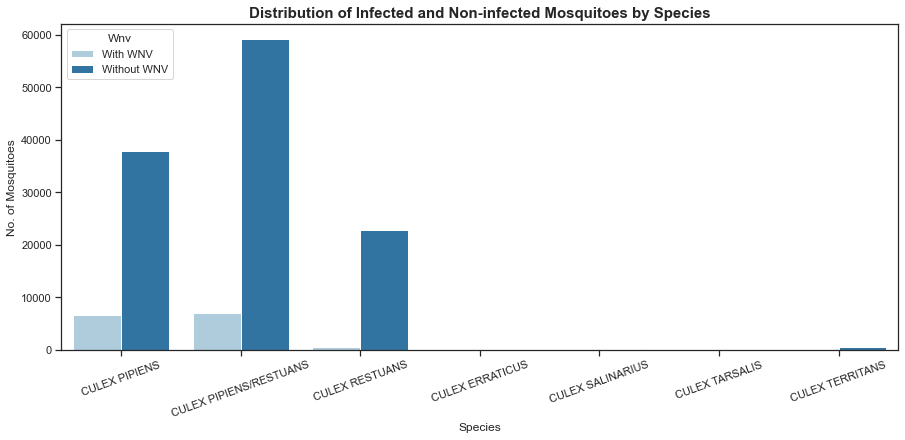

In [11]:
# View distribution of mosquito species with/without WNV

plt.figure(figsize =(15,6))
plt.xticks(rotation=20)
sns.barplot(data=df_species, x=df_species.index, y='NumMosquitos', hue='Wnv')
plt.title("Distribution of Infected and Non-infected Mosquitoes by Species", fontsize = 15, fontweight='bold')
plt.ylabel("No. of Mosquitoes")

The main mosquito species carrying WNV are Culex Pipiens and Culex Restuans. They form 90% of the infected mosquitoes collected. Typically WNV is transmitted by Culex Pipiens mosquitoes. It takes about 7-10 days for the eggs to become an adult mosquito. ([source](https://www.cdc.gov/mosquitoes/about/life-cycles/culex.html))

However, our dataset indicates that another species Culex Restuans also tested positive for the virus. [Research](https://www.ajtmh.org/view/journals/tpmd/83/3/article-p607.xml) has shown that the Culex Restuans mosquitoes:
1. Tend to live in colder temperature, hence their abundance decreases in the warmer months.
2. In terms of virus transmission, the Culex Restuans were marginally less likely to become infected.

Both these points explain why we see significantly lower count for this species.

In [12]:
# number of mosquitoes by year

df_merged_month_0 = df_merged_0.resample('M').sum()
df_merged_month_1 = df_merged_1.resample('M').sum()

In [13]:
# number of mosquitoes by year

df_merged_year_0 = df_merged_0.resample('Y').sum()
df_merged_year_1 = df_merged_1.resample('Y').sum()

# append both datasets together

df_merged_year = df_merged_year_0.append(df_merged_year_1)
df_merged_year.head()

,Latitude,Longitude,AddressAccuracy,NumMosquitos,WnvPresent,Year,Month,Week,DayOfWeek,Station,Tmax,Tmin,Tavg,Depart,DewPoint,WetBulb,Heat,Cool,Sunrise,Sunset,SnowFall,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed,Humidity,Tmax_7_days,Tavg_7_days,Depart_7_days,DewPoint_7_days,WetBulb_7_days,Heat_7_days,Cool_7_days,Sunrise_7_days,Sunset_7_days,SnowFall_7_days,PrecipTotal_7_days,StnPressure_7_days,SeaLevel_7_days,ResultSpeed_7_days,ResultDir_7_days,AvgSpeed_7_days,Humidity_7_days,Tmax_14_days,Tavg_14_days,Depart_14_days,DewPoint_14_days,WetBulb_14_days,Heat_14_days,Cool_14_days,Sunrise_14_days,Sunset_14_days,SnowFall_14_days,PrecipTotal_14_days,StnPressure_14_days,SeaLevel_14_days,ResultSpeed_14_days,ResultDir_14_days,AvgSpeed_14_days,Humidity_14_days,Tmax_21_days,Tavg_21_days,Depart_21_days,DewPoint_21_days,WetBulb_21_days,Heat_21_days,Cool_21_days,Sunrise_21_days,Sunset_21_days,SnowFall_21_days,PrecipTotal_21_days,StnPressure_21_days,SeaLevel_21_days,ResultSpeed_21_days,ResultDir_21_days,AvgSpeed_21_days,Humidity_21_days
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2007-12-31,149478.204330,-313410.884667,26705,51974,0,7175025,28768,117749,7050,5933.0,303145,237958,271418.0,22592.0,223194,240983.0,1749.0,40792.0,1710270,6646566,0.0,616.37,104704.58,107074.59,19684.8,61681,26579.8,227658.80,297219.6,264885.7,15052.3,215619.3,234736.0,1317.2,33822.0,1701661.0,6655902.8,0.0,694.3,104714.9,107174.0,19662.2,55282.6,26122.1,225401.4,293964.0,262883.9,12316.4,213849.8,232948.3,1516.2,32020.2,1694054.0,6669925.9,0.0,601.2,104793.2,107270.2,20468.4,54584.8,27323.1,225558.2,293700.2,262495.5,11235.5,213295.0,232542.9,1767.0,31912.2,1683936.8,6683473.6,0.0,596.5,104774.5,107213.9,20166.8,55481.7,26958.9,224911.1
2008-12-31,0.000000,0.000000,0,0,0,0,0,0,0,0.0,0,0,0.0,0.0,0,0.0,0.0,0.0,0,0,0.0,0.00,0.00,0.00,0.0,0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2009-12-31,93339.780567,-195616.352542,17857,20708,0,4480070,16300,68054,5972,3337.0,172030,131554,152287.0,-2147.0,123052,135440.0,3385.0,10722.0,1019509,4195749,0.0,414.65,65282.55,66821.54,14084.4,38159,16574.8,142214.56,172804.5,153903.4,-458.5,124575.6,136566.7,2818.5,11754.9,1017286.3,4202967.9,0.0,313.9,65296.3,66813.4,12403.1,35233.6,16148.3,141893.2,172484.8,153820.3,-480.6,125156.3,136836.5,2215.2,11090.3,1014947.5,4207681.2,0.0,244.1,65257.0,66799.1,12931.1,37181.4,16588.6,143336.2,172076.7,153561.7,-667.2,124887.9,136584.7,2222.4,10865.9,1012476.8,4211533.9,0.0,250.1,65259.3,66790.2,13322.1,35973.7,16752.2,143285.4
2010-12-31,0.000000,0.000000,0,0,0,0,0,0,0,0.0,0,0,0.0,0.0,0,0.0,0.0,0.0,0,0,0.0,0.00,0.00,0.00,0.0,0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2011-12-31,83593.351843,-175176.448892,15936,17606,0,4015967,15103,62012,5993,2979.0,162224,127823,145473.0,5572.0,119740,129586.0,3629.0,19297.0,930820,3745875,0.0,151.37,58440.54,59796.28,11361.1,36328,14275.8,128809.79,161603.1,144990.5,5055.6,119399.0,129277.0,2271.2,17370.7,928546.2,3751118.5,0.0,379.7,58387.8,59741.4,11988.4,35065.0,15630.0,129304.0,162669.8,145816.8,5655.6,120212.9,130034.5,2025.3,17932.7,923622.5,3755561.6,0.0,350.4,58393.0,59739.3,11697.7,33076.5,15206.5,129507.8,163492.3,146631.6,6367.5,120146.4,130287.5,1995.9,18722.4,920164.2,3761097.3,0.0,319.1,58382.6,59731.7,12357.0,32801.9,15773.3,127690.0


In [14]:
#drop even year columns without data

df_merged_year.drop(["2008-12-31","2010-12-31","2012-12-31"], inplace = True)

In [15]:
for i in range(0,len(df_merged_year)):
    if df_merged_year.iloc[i,4] > 0:
        df_merged_year.iloc[i,4] = "Yes"
    else:
        df_merged_year.iloc[i,4] = "No"

df_merged_year

,Latitude,Longitude,AddressAccuracy,NumMosquitos,WnvPresent,Year,Month,Week,DayOfWeek,Station,Tmax,Tmin,Tavg,Depart,DewPoint,WetBulb,Heat,Cool,Sunrise,Sunset,SnowFall,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed,Humidity,Tmax_7_days,Tavg_7_days,Depart_7_days,DewPoint_7_days,WetBulb_7_days,Heat_7_days,Cool_7_days,Sunrise_7_days,Sunset_7_days,SnowFall_7_days,PrecipTotal_7_days,StnPressure_7_days,SeaLevel_7_days,ResultSpeed_7_days,ResultDir_7_days,AvgSpeed_7_days,Humidity_7_days,Tmax_14_days,Tavg_14_days,Depart_14_days,DewPoint_14_days,WetBulb_14_days,Heat_14_days,Cool_14_days,Sunrise_14_days,Sunset_14_days,SnowFall_14_days,PrecipTotal_14_days,StnPressure_14_days,SeaLevel_14_days,ResultSpeed_14_days,ResultDir_14_days,AvgSpeed_14_days,Humidity_14_days,Tmax_21_days,Tavg_21_days,Depart_21_days,DewPoint_21_days,WetBulb_21_days,Heat_21_days,Cool_21_days,Sunrise_21_days,Sunset_21_days,SnowFall_21_days,PrecipTotal_21_days,StnPressure_21_days,SeaLevel_21_days,ResultSpeed_21_days,ResultDir_21_days,AvgSpeed_21_days,Humidity_21_days
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2007-12-31,149478.204330,-313410.884667,26705,51974,No,7175025,28768,117749,7050,5933.0,303145,237958,271418.0,22592.0,223194,240983.0,1749.0,40792.0,1710270,6646566,0.0,616.37,104704.58,107074.59,19684.8,61681,26579.8,227658.80,297219.6,264885.7,15052.3,215619.3,234736.0,1317.2,33822.0,1701661.0,6655902.8,0.0,694.3,104714.9,107174.0,19662.2,55282.6,26122.1,225401.4,293964.0,262883.9,12316.4,213849.8,232948.3,1516.2,32020.2,1694054.0,6669925.9,0.0,601.2,104793.2,107270.2,20468.4,54584.8,27323.1,225558.2,293700.2,262495.5,11235.5,213295.0,232542.9,1767.0,31912.2,1683936.8,6683473.6,0.0,596.5,104774.5,107213.9,20166.8,55481.7,26958.9,224911.1
2009-12-31,93339.780567,-195616.352542,17857,20708,No,4480070,16300,68054,5972,3337.0,172030,131554,152287.0,-2147.0,123052,135440.0,3385.0,10722.0,1019509,4195749,0.0,414.65,65282.55,66821.54,14084.4,38159,16574.8,142214.56,172804.5,153903.4,-458.5,124575.6,136566.7,2818.5,11754.9,1017286.3,4202967.9,0.0,313.9,65296.3,66813.4,12403.1,35233.6,16148.3,141893.2,172484.8,153820.3,-480.6,125156.3,136836.5,2215.2,11090.3,1014947.5,4207681.2,0.0,244.1,65257.0,66799.1,12931.1,37181.4,16588.6,143336.2,172076.7,153561.7,-667.2,124887.9,136584.7,2222.4,10865.9,1012476.8,4211533.9,0.0,250.1,65259.3,66790.2,13322.1,35973.7,16752.2,143285.4
2011-12-31,83593.351843,-175176.448892,15936,17606,No,4015967,15103,62012,5993,2979.0,162224,127823,145473.0,5572.0,119740,129586.0,3629.0,19297.0,930820,3745875,0.0,151.37,58440.54,59796.28,11361.1,36328,14275.8,128809.79,161603.1,144990.5,5055.6,119399.0,129277.0,2271.2,17370.7,928546.2,3751118.5,0.0,379.7,58387.8,59741.4,11988.4,35065.0,15630.0,129304.0,162669.8,145816.8,5655.6,120212.9,130034.5,2025.3,17932.7,923622.5,3755561.6,0.0,350.4,58393.0,59739.3,11697.7,33076.5,15206.5,129507.8,163492.3,146631.6,6367.5,120146.4,130287.5,1995.9,18722.4,920164.2,3761097.3,0.0,319.1,58382.6,59731.7,12357.0,32801.9,15773.3,127690.0
2013-12-31,90109.627955,-188835.258036,17318,30232,No,4333989,16158,66526,6928,3270.0,177034,136010,156990.0,5711.0,126589,138456.0,416.0,17461.0,991677,4050975,0.0,319.01,63089.70,64555.40,14151.9,39669,16911.5,132772.74,176822.0,157900.3,6338.2,128857.6,139785.3,949.5,18760.4,989070.9,4054790.5,0.0,181.6,63106.2,64584.1,14073.1,36079.7,17310.8,136056.9,175064.9,156298.2,4750.2,127728.3,138795.2,1325.4,17609.2,986069.7,4061369.8,0.0,183.6,63115.5,64580.9,13897.5,34930.0,17034.8,137057.9,174686.6,156088.7,4442.5,127519.4,138540.2,1125.4,17221.1,981630.9,4066281.1,0.0,169.1,63109.2,64589.1,14128.1,34237.9,17289.6,136991.7
2007-12-31,9865.560256,-20691.767390,1728,6714,Yes,473652,1914,7926,495,394.0,20070,16298,18240.0,1491.0,15616,16501.0,43.0,2943.0,115465,437439,0.0,65.27,6904.06,7059.98,1088.1,3846,1593.0,16346.80,19544.5,17695.5,883.3,15119.9,16041.2,20.3,2375.8,114437.5,437941.3,0.0,88.4,6907.7,7070.3,1098.9,3568.2,1633.4,16487.

Text(0, 0.5, 'Count')

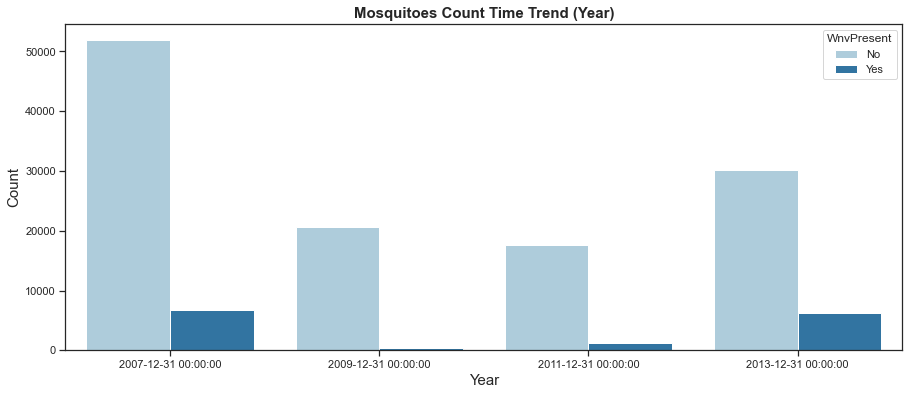

In [16]:
# Plot the number of mosquitoes time trend (year):

plt.figure(figsize =(15,6))
sns.barplot(data=df_merged_year, x=df_merged_year.index, y='NumMosquitos', hue='WnvPresent')
plt.title("Mosquitoes Count Time Trend (Year)", fontsize = 15, fontweight='bold')
plt.xlabel("Year",fontsize = 15)
plt.ylabel("Count",fontsize = 15)

Overall, we observed large decrease in mosquito count from 2007 to 2009 even though there were no records of spraying. Just based on this bar chart, the spraying effort did not seem effective in 2011 and 2013 - indicating that we'll need to further investigate the datasets.

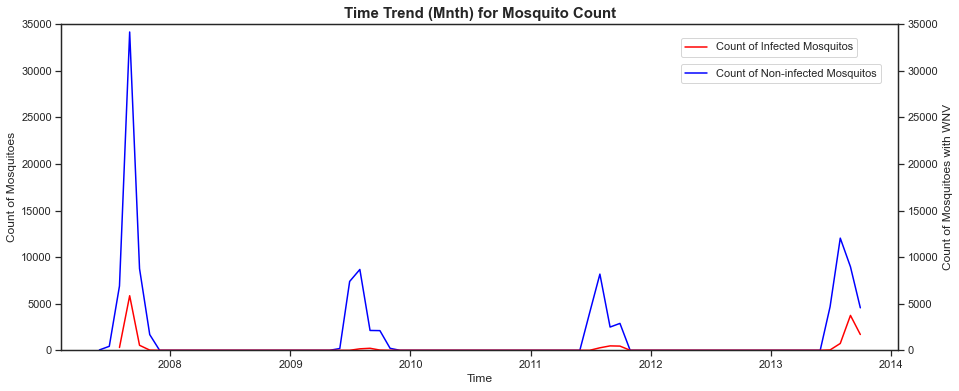

In [17]:
# Plot the number of mosquitoes time trend (month):

fig, ax1 = plt.subplots(figsize=(15,6))
ax1.plot(df_merged_month_0['NumMosquitos'],  color = 'blue')
ax2 = ax1.twinx()
ax2.plot(df_merged_month_1['NumMosquitos'], color = "red")
ax1.set_ylim([0, 35000])
ax2.set_ylim([0, 35000])
plt.title("Time Trend (Mnth) for Mosquito Count", fontsize = 15, fontweight='bold')
ax1.set_ylabel("Count of Mosquitoes", fontsize = 12)
ax2.set_ylabel("Count of Mosquitoes with WNV",fontsize = 12)
ax1.set_xlabel("Time", fontsize = 12)
ax1.legend([f'Count of Non-infected Mosquitos'], loc= (0.74,0.82))
ax2.legend([f'Count of Infected Mosquitos'], loc= (0.74,0.9))

In [18]:
# View the top 15 locations with most mosquitoes:

df_merged_top = df_merged.groupby("Trap").NumMosquitos.sum().sort_values(ascending = False).head(15)
df_merged_top

Trap
T115    21668
T900    15386
T138     9936
T002     3710
T128     3315
T135     3122
T103     2988
T008     2668
T212     2595
T158     2575
T903     2327
T114     2161
T225     2014
T151     1969
T009     1940
Name: NumMosquitos, dtype: int64

In [19]:
# for mosquitoes with West Nile virus (Wnv)

df_loc_0 = pd.DataFrame(df_merged_0.groupby("Trap").NumMosquitos.sum())
df_loc_0["Wnv Present"] = "Yes"
df_loc_0.sort_values("NumMosquitos",ascending = False)

,NumMosquitos,Wnv Present
Trap,,
T115,19790,Yes
T900,13326,Yes
T138,9177,Yes
T002,3210,Yes
T128,2833,Yes
T135,2806,Yes
T103,2715,Yes
T212,2500,Yes
T158,2389,Yes


In [20]:
# for mosquitoes without West Nile Virus (Wnv)

df_loc_1 = pd.DataFrame(df_merged_1.groupby("Trap").NumMosquitos.sum())
df_loc_1["Wnv Present"] = "No"
df_loc_1.sort_values("NumMosquitos",ascending = False)

,NumMosquitos,Wnv Present
Trap,,
T900,2060,No
T115,1878,No
T138,759,No
T002,500,No
T128,482,No
T003,380,No
T008,330,No
T135,316,No
T013,316,No


In [21]:
# append both dataframes

df_loc = df_loc_1.append(df_loc_0)
df_loc

,NumMosquitos,Wnv Present
Trap,,
T002,500,No
T003,380,No
T005,17,No
T006,46,No
T008,330,No
...,...,...
T236,365,Yes
T237,18,Yes
T238,34,Yes


In [22]:
# filter out to top 15 locations with most mosquitoes

df_loc_filter = df_loc.loc[['T115', 'T900', 'T138', 'T002', 'T128', 'T135', 'T103', 'T008', 'T212',
       'T158', 'T903', 'T114', 'T225', 'T151', 'T009'],:]

Text(0.5, 1.0, 'Overall Mosquito Count for Top 15 locations')

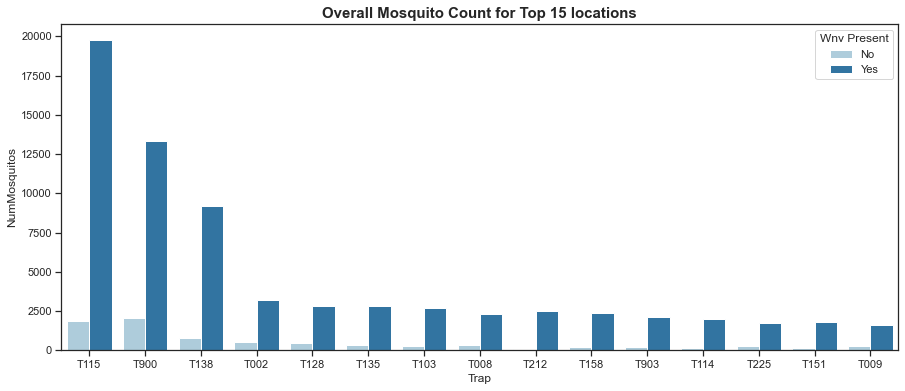

In [23]:
# Mosquito counts with/without WNV for locations in top 15 

plt.figure(figsize =(15,6))
sns.barplot(data=df_loc_filter, x=df_loc_filter.index, y='NumMosquitos', hue='Wnv Present')
plt.title("Overall Mosquito Count for Top 15 locations", fontsize = 15, fontweight='bold')

The top 5 locations with most overall mosquitoes over the years:
1. T115 (1200 S DOTY AVE, Chicago, IL) 
2. T900 (1000 W OHARE AIRPORT, Chicago, IL)
3. T138 (1000 S STONY ISLAND AVE, Chicago, IL)
4. T002 (4100 N OAK PARK AVE, Chicago, IL)
5. T128 (2400 E 105TH ST, Chicago, IL)

In [24]:
# group data by year and trap
df_merged_grp = df_merged_index.groupby([df_merged_index.index.year,"Trap"]).agg(
    NumMosquitos = ("NumMosquitos", "sum"),
    WnvPresent = ("WnvPresent","mean"))

# group data by year
df_merged_grp_year = df_merged_index.groupby([df_merged_index.index.year]).agg(
    NumMosquitos = ("NumMosquitos", "sum"),
    WnvPresent = ("WnvPresent","mean"))

display(df_merged_grp)
display(df_merged_grp_year)

NumMosquitos  WnvPresent
Date Trap                          
2007 T001            25    0.000000
     T002           740    0.163265
     T003           214    0.133333
     T004            59    0.000000
     T005            50    0.142857
...                 ...         ...
2013 T233           665    0.205882
     T235           395    0.225806
     T236           358    0.037037
     T900          5689    0.193277
     T903           194    0.000000

[343 rows x 2 columns]

,NumMosquitos,WnvPresent
Date,,
2007,58688,0.061926
2009,21108,0.008448
2011,18799,0.027751
2013,36444,0.099916


1. Based on the data that we have for four years (2007, 2009, 2011, 2013), the mosquito population typically emerge during the spring, summer and fall periods
2. The 2007 year recorded the highest number of mosquitoes (close to 35,000 at the peak)
3. There are similarities in the trend of the mosquito population over the years:
    - The population will peak during summer and decreases in the subsequent weeks as the weather cools
    - There is a lag time from the start of the mosquito season to the time when the first cases of infected mosquitoes were detected

Text(0.5, 1.0, 'Total No. of Mosquitos Captured by Year')

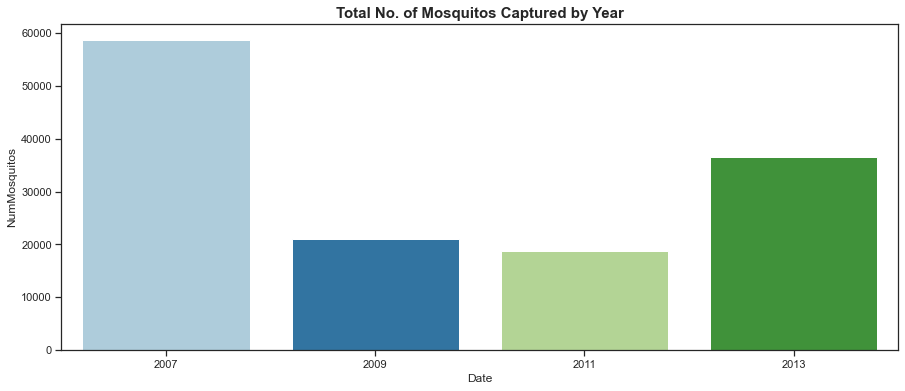

In [25]:
# Plot no. mosquitoes captured and tested

plt.figure(figsize =(15,6))
sns.barplot(data = df_merged_grp_year, x = df_merged_grp_year.index, y='NumMosquitos')
plt.title("Total No. of Mosquitos Captured by Year", fontsize = 15, fontweight='bold')

Based on this chart, we see that the spray efforts in 2011 and 2013 did not have a significant impact in reducing the mosquito counts for year 2011 to 2013. In fact, we see the number of mosquitoes nearly doubled in 2013, from 20,000 to ~40,000.

In [26]:
# reset index

df_merged_grp = df_merged_grp.reset_index()

In [27]:
# conditions for top 5 traps

df_merged_plot = df_merged_grp[(df_merged_grp["Trap"] == 'T115') | (df_merged_grp["Trap"] == 'T900') | (df_merged_grp["Trap"] == 'T138') | (df_merged_grp["Trap"] == 'T002') | (df_merged_grp["Trap"] == 'T128')]

Text(0.5, 1.0, '5 Traps with Most Overall Number of Mosquitos (by Year)')

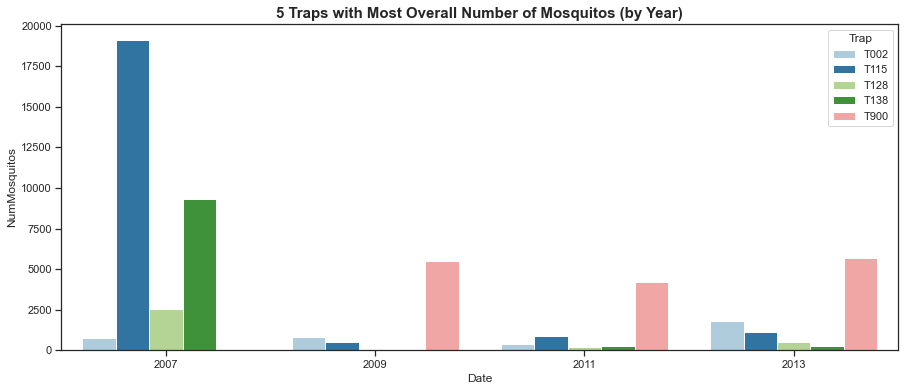

In [28]:
# bar plot for top 5 traps with most overall number of mosquitoes

plt.figure(figsize =(15,6))
sns.barplot(data=df_merged_plot, x="Date", y='NumMosquitos', hue='Trap')
plt.title("5 Traps with Most Overall Number of Mosquitos (by Year)", fontsize = 15, fontweight='bold')

In this comparison chart for the different traps, we can see: 
1. There's a large decrease in mosquito count from 2007 to 2009 even though the spray efforts were in 2011 and 2013. There may be other factors contributing to the changes.
2. The T900 trap had the highest mosquito count in 2009, 2011 and 2013 - they had relatively close figures from ~4000 to ~6000 over the years. It's likely that the spraying efforts in 2011 and 2013 did not have much impact on controlling the population in those years. 


### Spraying Effectiveness on Mosquito Population

In [29]:
# create dataframe for 2007 and 2009 data only

frame = df_merged_0.loc[(df_merged_0["Year"]==2007) | (df_merged_0["Year"]==2009)]
frame.head()

,Species,Trap,Latitude,Longitude,AddressAccuracy,NumMosquitos,WnvPresent,Year,Month,Week,DayOfWeek,Station,Tmax,Tmin,Tavg,Depart,DewPoint,WetBulb,Heat,Cool,Sunrise,Sunset,CodeSum,SnowFall,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed,Sunrise_1,Sunset_1,daylight_duration,Humidity,Tmax_7_days,Tavg_7_days,Depart_7_days,DewPoint_7_days,WetBulb_7_days,Heat_7_days,...,StnPressure_7_days,SeaLevel_7_days,ResultSpeed_7_days,ResultDir_7_days,AvgSpeed_7_days,Humidity_7_days,Tmax_14_days,Tavg_14_days,Depart_14_days,DewPoint_14_days,WetBulb_14_days,Heat_14_days,Cool_14_days,Sunrise_14_days,Sunset_14_days,SnowFall_14_days,PrecipTotal_14_days,StnPressure_14_days,SeaLevel_14_days,ResultSpeed_14_days,ResultDir_14_days,AvgSpeed_14_days,Humidity_14_days,Tmax_21_days,Tavg_21_days,Depart_21_days,DewPoint_21_days,WetBulb_21_days,Heat_21_days,Cool_21_days,Sunrise_21_days,Sunset_21_days,SnowFall_21_days,PrecipTotal_21_days,StnPressure_21_days,SeaLevel_21_days,ResultSpeed_21_days,ResultDir_21_days,AvgSpeed_21_days,Humidity_21_days
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2007-05-29,CULEX PIPIENS/RESTUANS,T002,41.954690,-87.800991,9,1,0,2007,5,22,1,1.0,88,60,74.0,10.0,58,65.0,0.0,9.0,421,1917,BR HZ,0.0,0.0,29.39,30.11,5.8,18,6.5,1900-01-01 04:21:00,1900-01-01 19:17:00,0 days 14:56:00,57.4,78.7,67.7,4.9,52.0,59.1,0.7,...,29.4,30.1,5.8,16.7,7.3,58.0,79.0,68.7,6.4,50.9,58.9,1.3,5.0,422.6,1914.7,0.0,0.1,29.4,30.1,7.4,15.9,9.3,54.9,78.9,67.3,5.5,48.6,56.9,1.9,4.2,423.8,1913.0,0.0,0.1,29.4,30.1,7.9,14.6,9.5,53.0
2007-05-29,CULEX RESTUANS,T002,41.954690,-87.800991,9,1,0,2007,5,22,1,1.0,88,60,74.0,10.0,58,65.0,0.0,9.0,421,1917,BR HZ,0.0,0.0,29.39,30.11,5.8,18,6.5,1900-01-01 04:21:00,1900-01-01 19:17:00,0 days 14:56:00,57.4,78.7,67.7,4.9,52.0,59.1,0.7,...,29.4,30.1,5.8,16.7,7.3,58.0,79.0,68.7,6.4,50.9,58.9,1.3,5.0,422.6,1914.7,0.0,0.1,29.4,30.1,7.4,15.9,9.3,54.9,78.9,67.3,5.5,48.6,56.9,1.9,4.2,423.8,1913.0,0.0,0.1,29.4,30.1,7.9,14.6,9.5,53.0
2007-05-29,CULEX RESTUANS,T007,41.994991,-87.769279,9,1,0,2007,5,22,1,1.0,88,60,74.0,10.0,58,65.0,0.0,9.0,421,1917,BR HZ,0.0,0.0,29.39,30.11,5.8,18,6.5,1900-01-01 04:21:00,1900-01-01 19:17:00,0 days 14:56:00,57.4,78.7,67.7,4.9,52.0,59.1,0.7,...,29.4,30.1,5.8,16.7,7.3,58.0,79.0,68.7,6.4,50.9,58.9,1.3,5.0,422.6,1914.7,0.0,0.1,29.4,30.1,7.4,15.9,9.3,54.9,78.9,67.3,5.5,48.6,56.9,1.9,4.2,423.8,1913.0,0.0,0.1,29.4,30.1,7.9,14.6,9.5,53.0
2007-05-29,CULEX PIPIENS/RESTUANS,T015,41.974089,-87.824812,8,1,0,2007,5,22,1,1.0,88,60,74.0,10.0,58,65.0,0.0,9.0,421,1917,BR HZ,0.0,0.0,29.39,30.11,5.8,18,6.5,1900-01-01 04:21:00,1900-01-01 19:17:00,0 days 14:56:00,57.4,78.7,67.7,4.9,52.0,59.1,0.7,...,29.4,30.1,5.8,16.7,7.3,58.0,79.0,68.7,6.4,50.9,58.9,1.3,5.0,422.6,1914.7,0.0,0.1,29.4,30.1,7.4,15.9,9.3,54.9,78.9,67.3,5.5,48.6,56.9,1.9,4.2,423.8,1913.0,0.0,0.1,29.4,30.1,7.9,14.6,9.5,53.0
2007-05-29,CULEX RESTUANS,T015,41.974089,-87.824812,8,4,0,2007,5,22,1,1.0,88,60,74.0,10.0,58,65.0,0.0,9.0,421,1917,BR HZ,0.0,0.0,29.39,30.11,5.8,18,6.5,1900-01-01 04:21:00,1900-01-01 19:17:00,0 days 14:56:00,57.4,78.7,67.7,4.9,52.0,59.1,0.7,...,29.4,30.1,5.8,16.7,7.3,58.0,79.0,68.7,6.4,50.9,58.9,1.3,5.0,422.6,1914.7,0.0,0.1,29.4,30.1,7.4,15.9,9.3,54.9,78.9,67.3,5.5,48.6,56.9,1.9,4.2,423.8,1913.0,0.0,0.1,29.4,30.1,7.9,14.6,9.5,53.0


In [30]:
# set date to datetime

df_spray["Date"] = pd.to_datetime(df_spray["Date"])
df_spray['Year'] = df_spray['Date'].dt.year
df_spray['Month'] = df_spray['Date'].dt.month
df_spray['Week'] = df_spray['Date'].dt.week
df_spray['Day'] = df_spray['Date'].dt.day

(21.0, 41.0)

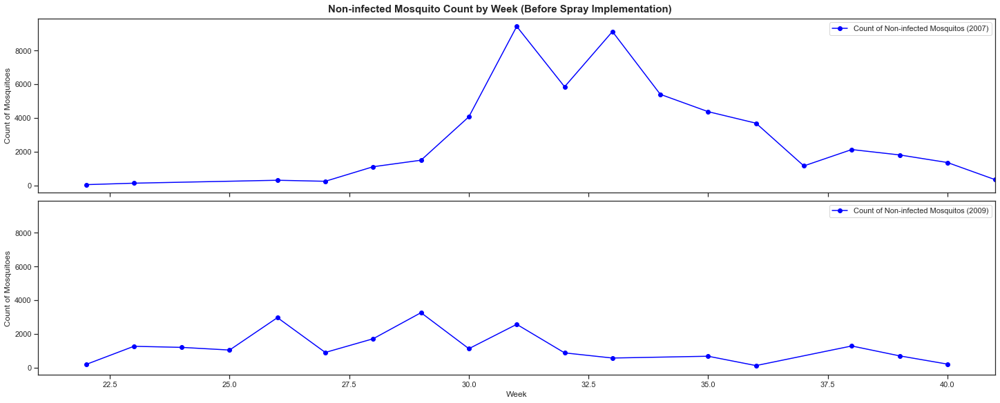

In [31]:
# to plot chart for number of non-infected mosquitoes for year 2007 and 2009 vs week number (before spray implementation)

fig, ax = plt.subplots(2, figsize=(20,8), sharey=True, sharex=True, layout="constrained")
plt.suptitle("Non-infected Mosquito Count by Week (Before Spray Implementation)", fontsize = 15, fontweight='bold')
ax[0].plot(df_merged_0[df_merged_0["Year"]==2007].groupby(['Week'])['NumMosquitos'].sum(), color = 'blue', marker="o")
ax[0].set_ylabel("Count of Mosquitoes", fontsize = 12)
ax[1].plot(df_merged_0[df_merged_0["Year"]==2009].groupby(['Week'])['NumMosquitos'].sum(), color = 'blue', marker="o")
ax[1].set_xlabel("Week", fontsize = 12)
ax[1].set_ylabel("Count of Mosquitoes", fontsize = 12)
ax[0].legend([f'Count of Non-infected Mosquitos (2007)'])
ax[1].legend([f'Count of Non-infected Mosquitos (2009)'])
plt.xlim([21, 41])

(21.0, 41.0)

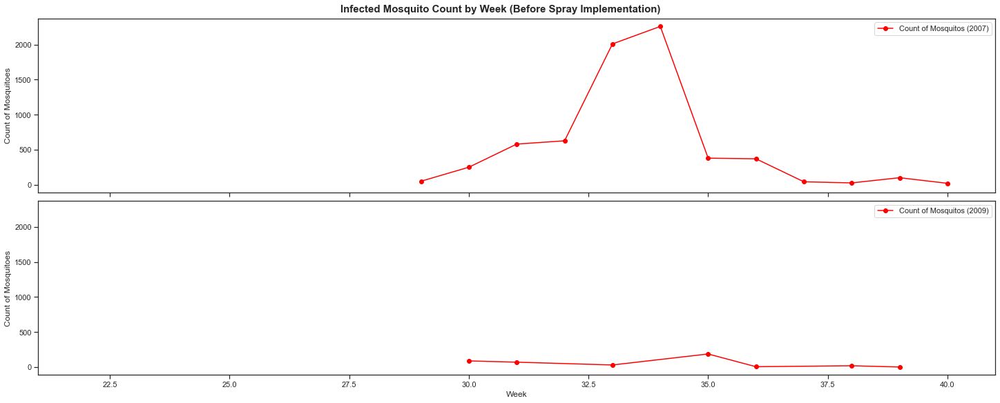

In [32]:
# to plot chart for number of infected mosquitoes for year 2007 and 2009 vs week number (before spray implementation)

fig, ax = plt.subplots(2, figsize=(20,8), sharey=True, sharex=True, layout="constrained")
plt.suptitle("Infected Mosquito Count by Week (Before Spray Implementation)", fontsize = 15, fontweight='bold')
ax[0].plot(df_merged_1[df_merged_1["Year"]==2007].groupby(['Week'])['NumMosquitos'].sum(), color = 'red', marker="o")
ax[0].set_ylabel("Count of Mosquitoes", fontsize = 12)
ax[1].plot(df_merged_1[df_merged_1["Year"]==2009].groupby(['Week'])['NumMosquitos'].sum(), color = 'red', marker="o")
ax[1].set_xlabel("Week", fontsize = 12)
ax[1].set_ylabel("Count of Mosquitoes", fontsize = 12)
ax[0].legend([f'Count of Mosquitos (2007)'])
ax[1].legend([f'Count of Mosquitos (2009)'])
plt.xlim([21, 41])

Based on the charts of non-infected and infected mosquitoes in 2007 and 2009 (before spraying effort started),
- In 2007, the peak of the mosquito population occurs within Week 31-32 period (first two weeks of August), whereas the peak of the population for 2009 occured approximately at Week 28 (mid-July). 
- For both years, the population size decreases after the peak and slowly taper off towards the end of summer season.
- The trend of WNV-infected mosquitoes in 2007 takes after the shape of the non-infected mosquito population for the same year. Similar pattern was observed for the 2009 data. This phenomenon can be explained from the way mosquitoes become infected - higher mosquito population increases the chances of mosquitoes biting an infected bird, therefore resulting in higher number of infected mosquitoes.

(21.0, 41.0)

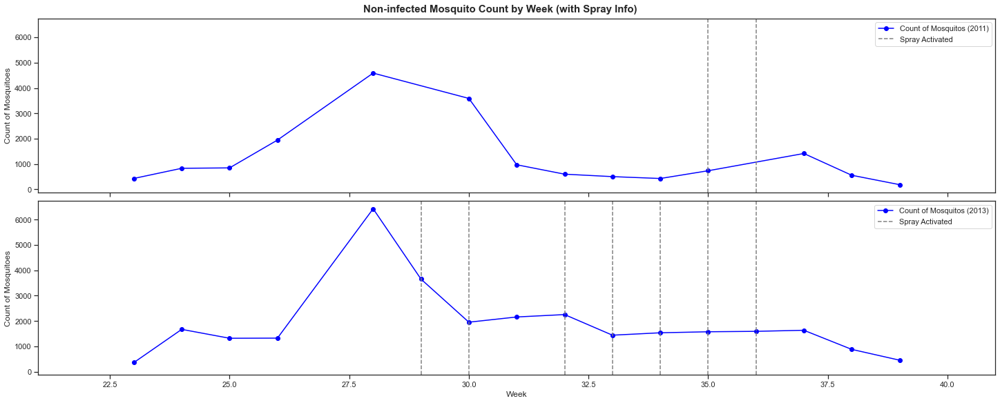

In [33]:
# to plot chart for number of non-infected mosquitoes for year 2007 and 2009 vs week number (with spray info)

fig, ax = plt.subplots(2, figsize=(20,8), sharey=True, sharex=True, layout="constrained")
plt.suptitle("Non-infected Mosquito Count by Week (with Spray Info)", fontsize = 15, fontweight='bold')
ax[0].plot(df_merged_0[df_merged_0["Year"]==2011].groupby(['Week'])['NumMosquitos'].sum(), color = 'blue', marker="o")
ax[0].set_ylabel("Count of Mosquitoes", fontsize = 12)
# ax[3].title.set_text("Year 2013")
ax[1].plot(df_merged_0[df_merged_0["Year"]==2013].groupby(['Week'])['NumMosquitos'].sum(), color = 'blue', marker="o")
ax[1].set_xlabel("Week", fontsize = 12)
ax[1].set_ylabel("Count of Mosquitoes", fontsize = 12)
for week in df_spray[df_spray["Year"]==2011]['Week'].unique():
    ax[0].axvline(x=week, linestyle='--', color='grey', label='Spray Activated')
for week in df_spray[df_spray["Year"]==2013]['Week'].unique():
    ax[1].axvline(x=week, linestyle='--', color='grey', label='Spray Activated')
ax[0].legend([f'Count of Mosquitos (2011)', 'Spray Activated'])
ax[1].legend([f'Count of Mosquitos (2013)', 'Spray Activated'])
plt.xlim([21, 41])

Based on the spraying efforts done in 2011 and 2013, 
- The 2011 efforts were done towards the end of summer, which did not have an impact on the mosquito count.
- In 2013, spraying was done more often from mid-season (almost weekly at various locations) and we can see that there is some impact on the mosquito count after week 29 (end of July). However the effect does take a while to work, suggesting that the spraying efforts should be done earlier. 

In [34]:
# to find the average number of mosquitoes for 2007 and 2009

frame.NumMosquitos.sum()/(19*2)

1912.6842105263158

In [35]:
# create data frame for non-infected mosquitoes for year 2013 to calculate the weekly average mosquito population

neg_spray13 = df_merged_0[df_merged_0["Year"]==2013]

In [36]:
neg_spray13.NumMosquitos.sum()/16

1889.5

(array([20. , 22.5, 25. , 27.5, 30. , 32.5, 35. , 37.5, 40. , 42.5]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

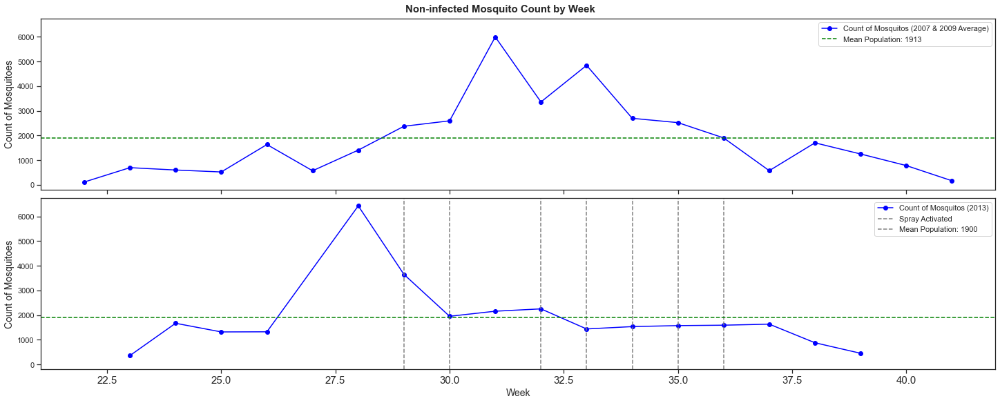

In [37]:
# to plot chart for non-infected mosquito population for 2007, 2009, 2013
fig, ax = plt.subplots(2, figsize=(20,8), sharey=True, sharex=True, layout="constrained")
plt.suptitle("Non-infected Mosquito Count by Week", fontsize = 15, fontweight='bold')
ax[0].plot(frame.groupby(['Week'])['NumMosquitos'].sum()/2, color = 'blue', marker="o") #this was divided by 2 to find the average no. of mosquitoes for 2 years
ax[0].set_ylabel("Count of Mosquitoes", fontsize = 14)
ax[1].plot(df_merged_0[df_merged_0["Year"]==2013].groupby(['Week'])['NumMosquitos'].sum(), color = 'blue', marker="o")
ax[1].set_xlabel("Week", fontsize = 14)
ax[1].set_ylabel("Count of Mosquitoes", fontsize = 14)
for week in df_spray[df_spray["Year"]==2013]['Week'].unique():
    ax[1].axvline(x=week, linestyle='--', color='grey', label='Spray Activated')

ax[0].axhline(y=1913, linestyle='--', color='green', label='Mean Population')
ax[1].axhline(y=1900, linestyle='--', color='green', label='Mean Population')

ax[0].legend([f'Count of Mosquitos (2007 & 2009 Average)', "Mean Population: 1913"])
ax[1].legend([f'Count of Mosquitos (2013)', 'Spray Activated', 'Mean Population: 1900'])

plt.xticks(fontsize=15)

To assess whether spraying was effective, we compared the 2013 data against the average of combined population of non-infected mosquitoes in 2007 and 2009:
- We observed that the mosquito population for 2013 decreased and stayed below the mean until the end of the season much earlier (Week 32, around mid-August) after the commencement of the spraying efforts. 
- The mosquito population peaked much earlier in 2013, compared to 2007 and 2009 average data. 

These show that the spraying effort showed results in controlling the mosquito population, when done early and consistently.

**Important caveat**: We took a pragmatic approach by assuming that weather conditions (e.g. similar temperature changes during the same period) and ground conditions (e.g. no introduction of huge construction sites) are constant for 2007, 2009 and 2013. With this assumption, we would expect the trend of the mosquito population to be similar every year.

(21.0, 41.0)

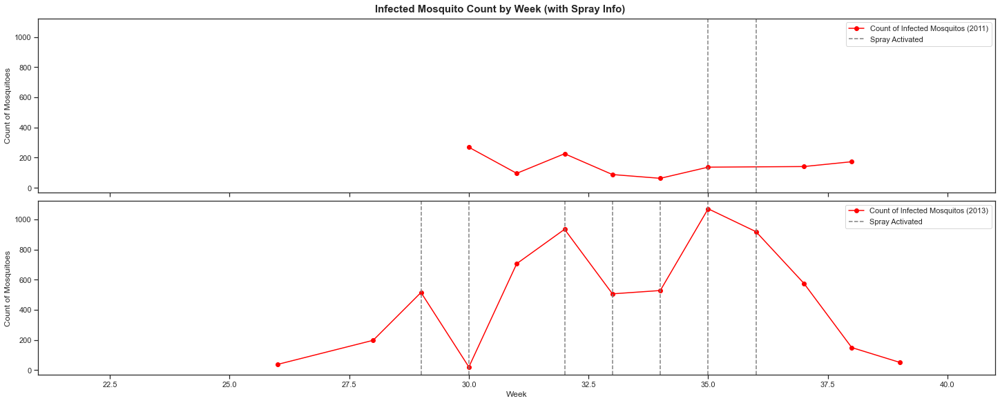

In [38]:
# to plot chart for number of infected mosquitoes for year 2011 and 2013 vs week number (with spray info) 
fig, ax = plt.subplots(2, figsize=(20,8), sharey=True, sharex=True, layout="constrained")
plt.suptitle("Infected Mosquito Count by Week (with Spray Info)", fontsize = 15, fontweight='bold')
ax[0].plot(df_merged_1[df_merged_1["Year"]==2011].groupby(['Week'])['NumMosquitos'].sum(), color = 'red', marker="o")
ax[0].set_ylabel("Count of Mosquitoes", fontsize = 12)
ax[1].plot(df_merged_1[df_merged_1["Year"]==2013].groupby(['Week'])['NumMosquitos'].sum(), color = 'red', marker="o")
ax[1].set_ylabel("Count of Mosquitoes", fontsize = 12)
for week in df_spray[df_spray["Year"]==2011]['Week'].unique():
    ax[0].axvline(x=week, linestyle='--', color='grey', label='Spray Activated')
for week in df_spray[df_spray["Year"]==2013]['Week'].unique():
    ax[1].axvline(x=week, linestyle='--', color='grey', label='Spray Activated')
ax[0].legend([f'Count of Infected Mosquitos (2011)', 'Spray Activated'])
ax[1].legend([f'Count of Infected Mosquitos (2013)', 'Spray Activated'])
ax[1].set_xlabel("Week", fontsize = 12)
plt.xlim([21, 41])

When we compared 2011 and 2013 spraying efforts on infected mosquito count,
- The 2011 efforts that were done towards the end of summer did not have an impact on WNV presence.
- In 2013, the spraying did not show consistent results in suppressing the population of infected mosquitoes in 2013.
- Instead, in 2013, we saw that virus count continue to rise in the mid-summer period despite consistent spraying efforts - suggesting that a targeted approach may be better for high-risk areas.

In [40]:
# filter to extract WNV data only

df_merged_wnv = df_merged[df_merged['WnvPresent']==1]

In [41]:
# function for plotting bar chart for the 4-year data

def rs_plot(var1, desc, rot):
    fig, ax = plt.subplots(nrows = 2, ncols = 2, sharex=True, sharey=True, figsize=(15, 2 * len(df_merged_wnv['Year'].unique())))
    ax = np.ravel(ax)
    plt.suptitle(f"Distribution of Traps w/ WNV by {desc}", fontsize = 13, fontweight='bold')
    for i, year in enumerate(df_merged_wnv['Year'].unique()):
        df_merged_wnv_dp = df_merged_wnv[df_merged_wnv['Year']==year].groupby(var1)['WnvPresent'].sum().to_frame()
        sns.barplot(x=df_merged_wnv_dp.index, y=df_merged_wnv_dp['WnvPresent'],
                     ci=None, color='#008B8B', ax=ax[i])
        ax[i].set_title(f'Year {year}', fontweight='bold')
        ax[i].set_ylabel(f'No. Traps w/ Wnv Detected')
        ax[i].set_xticklabels(ax[i].get_xticklabels(), rotation=rot)
        fig.tight_layout()
   

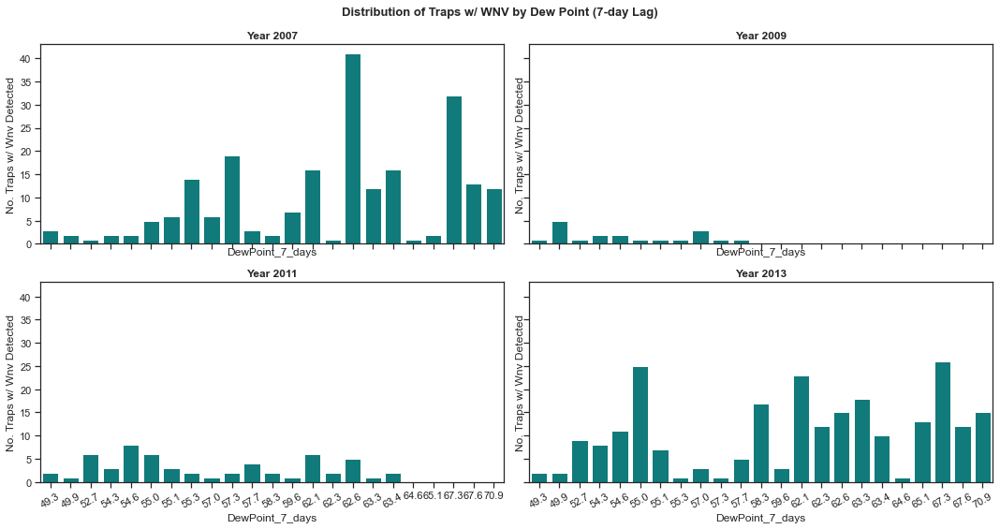

In [42]:
# plot of dew point pressure vs no. of traps with infected mosquitoes

rs_plot("DewPoint_7_days", "Dew Point (7-day Lag)", 30)

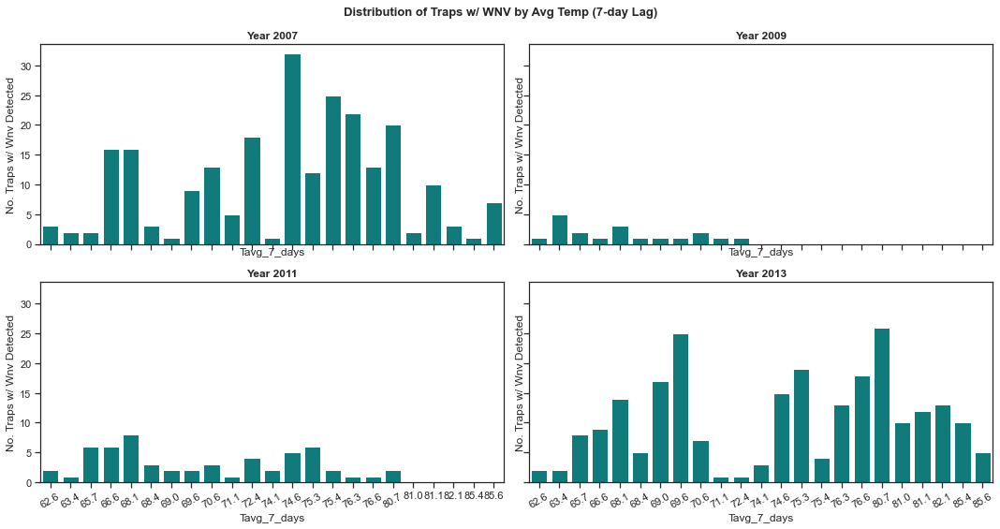

In [44]:
# plot of average daily temperature vs no. of traps with infected mosquitoes

rs_plot("Tavg_7_days", "Avg Temp (7-day Lag)", 30)

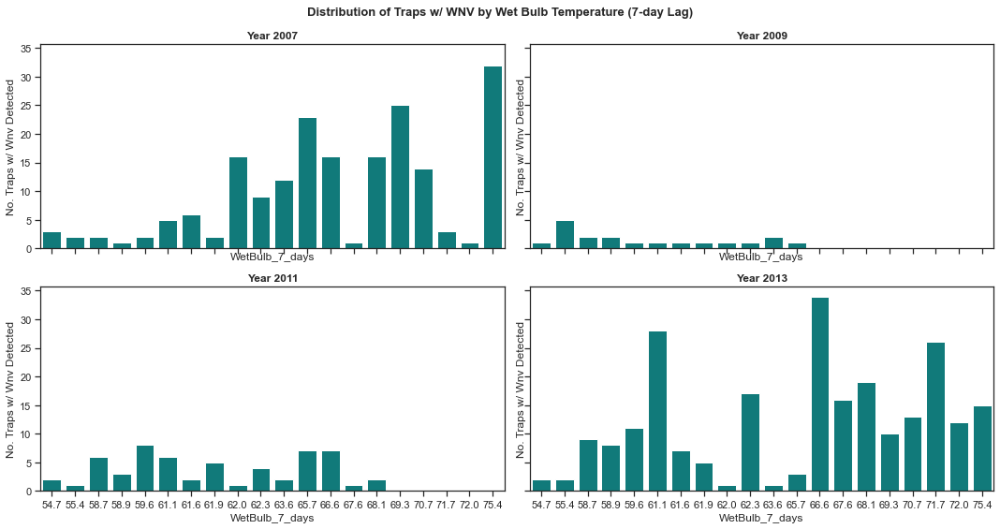

In [45]:
# plot of wet bulb temperature vs no. of traps with infected mosquitoes

rs_plot("WetBulb_7_days", "Wet Bulb Temperature (7-day Lag)", 0)

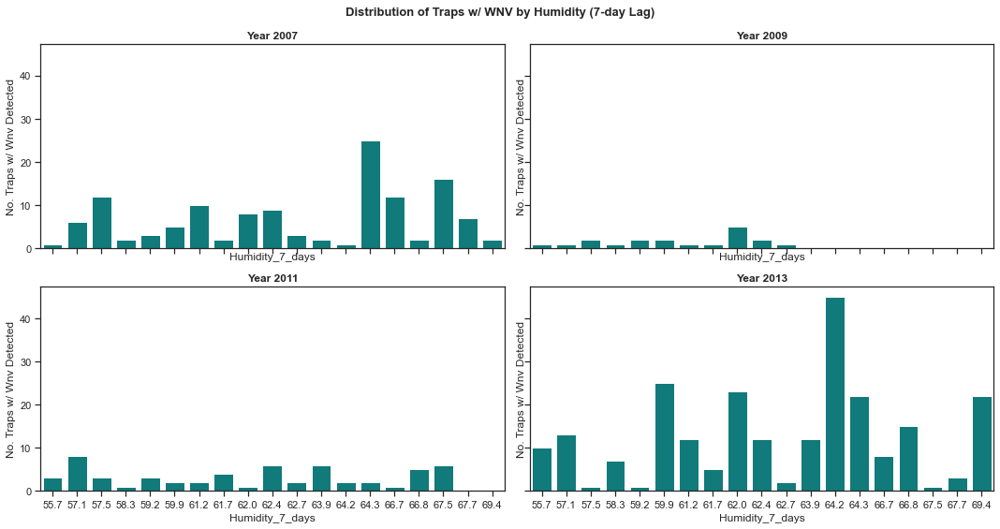

In [46]:
# plot of humidity vs no. of traps with infected mosquitoes

rs_plot("Humidity_7_days", "Humidity (7-day Lag)", 0)

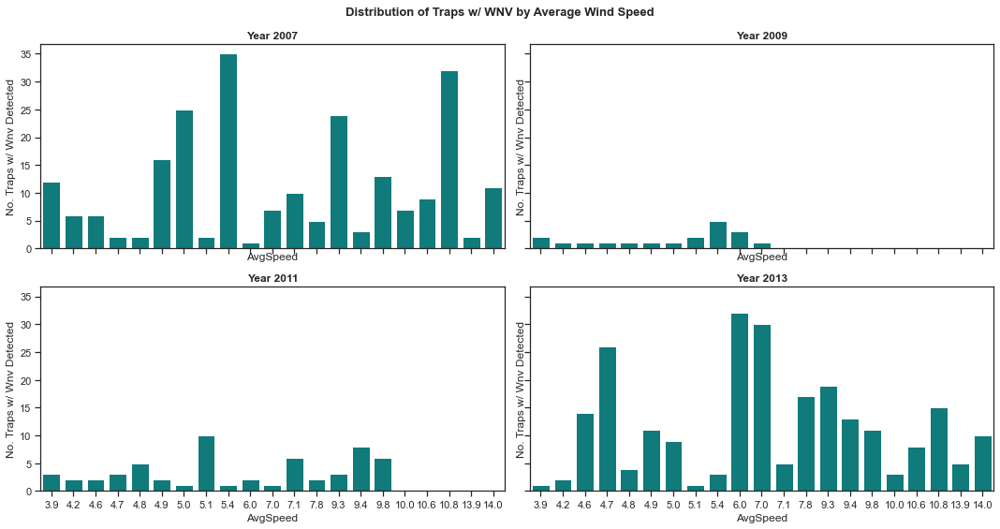

In [47]:
# plot of average wind speed vs no. of traps with infected mosquitoes

rs_plot("AvgSpeed", "Average Wind Speed", 0)

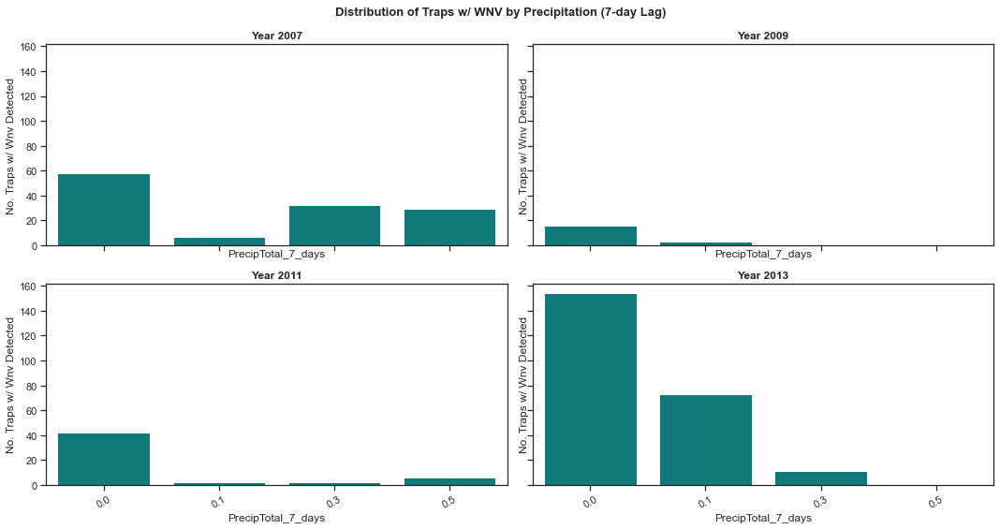

In [48]:
# plot of precipitation vs no. of traps with infected mosquitoes

rs_plot("PrecipTotal_7_days", "Precipitation (7-day Lag)", 30)

Text(0.5, 1.0, 'Relationship bet. Precipitation & Traps w/ WNV-infected Mosquitos')

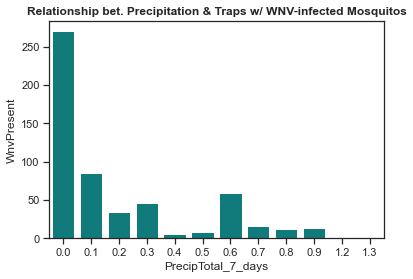

In [67]:
# bar chart for precipitation vs no. of traps with infected mosquitoes (4-year data)

df_merged_wnv_dp = df_merged_wnv.groupby("PrecipTotal_7_days")['WnvPresent'].sum().to_frame()
sns.barplot(x=df_merged_wnv_dp.index, y=df_merged_wnv_dp['WnvPresent'],
                ci=None, color='#008B8B')
plt.title(f'Relationship bet. Precipitation & Traps w/ WNV-infected Mosquitos', fontweight='bold')

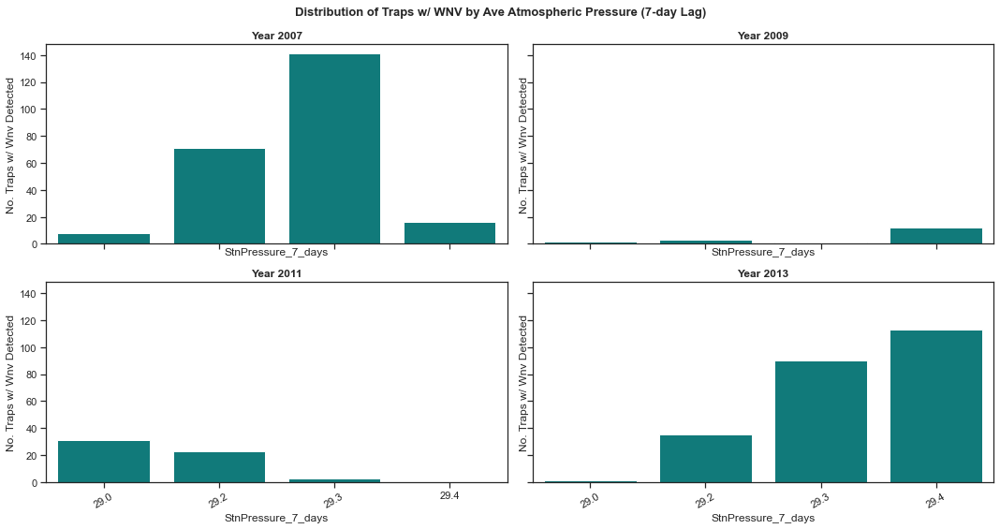

In [50]:
# plot of average atmospheric pressure vs no. of traps with infected mosquitoes

rs_plot("StnPressure_7_days", "Ave Atmospheric Pressure (7-day Lag)", 30)

For the analysis of the bar charts above, we will focus on the data for Year 2007 and Year 2013 as the volume of data for WNV-infected mosquitoes is larger. Due to the small sample of WNV-infected mosquitoes, it is less meaningful to analyse the dataset on its own.

Considering the lifecycle of the Culex Pipiens mosquito, we’ve plotted the several features with time-lag of 7 days to get a better sense of the weather conditions during the early stages of the mosquito life cycle. So based on the above we can see that:
1. For `DewPoint`, `WetBulb` and `Humidity`, we observed that the data followed a left-skewed distribution. This means that at higher dew point, wet bulb and humidity readings, we would expect more infected mosquitoes. The general trend is also observed for temperature (`Tavg`) where there was more infected mosquitoes detected at higher temperatures.
2. However for wind speed (`AvgSpeed`) and rainfall (`PrecipTotal`), the 2009, 2011 and 2013 distribution shows that when there’s lower wind speed and lower rainfall, there are more infected mosquitoes present. This makes sense as their mobility would be affected by strong winds and rain. Low wind speed and low rain also mean that their breeding grounds (stale water) would not be disturbed, thus facilitating the growth of the mosquito population.

In [66]:
# function to create multi-year line plots

def lineplot(var1, desc, rot):
    fig, ax = plt.subplots(nrows = 2, ncols = 2, sharey=True, figsize=(15, 8))
    ax = np.ravel(ax)
    plt.suptitle(f"{desc} vs No. of Traps w/ WNV Detected", fontsize = 13, fontweight='bold')
    for i, year in enumerate(df_merged_wnv['Year'].unique()):
   
        sns.lineplot(x=df_merged_wnv[df_merged_wnv['Year']==year]['Date'], y=df_merged_wnv[df_merged_wnv['Year']==year][var1],
                     ci=None, color='blue', label=f'{var1}', ax=ax[i])
        ax[i].set_xlabel('Date', fontsize=13)
        ax[i].set_ylabel(f'{var1}', fontsize=13, color='blue')
        ax[i].legend(loc=2)
        
        wnv = df_merged_wnv[df_merged_wnv['Year']==year].groupby(['Date'])['WnvPresent'].sum()
        df_wnv = pd.DataFrame(wnv)

        ax2 = ax[i].twinx()
        sns.lineplot(x=df_wnv.index, y=df_wnv['WnvPresent'],
                     ci=None, color='red', label=f'WnvPresent', ax=ax2)
        ax2.set_ylabel(f'WnvPresent', fontsize=13, color='red')
        ax2.legend(loc=1)

        plt.title(f'Year {year}', fontweight='bold')
        ax[i].set_xticklabels(ax[i].get_xticklabels(), rotation=rot)

        fig.tight_layout()

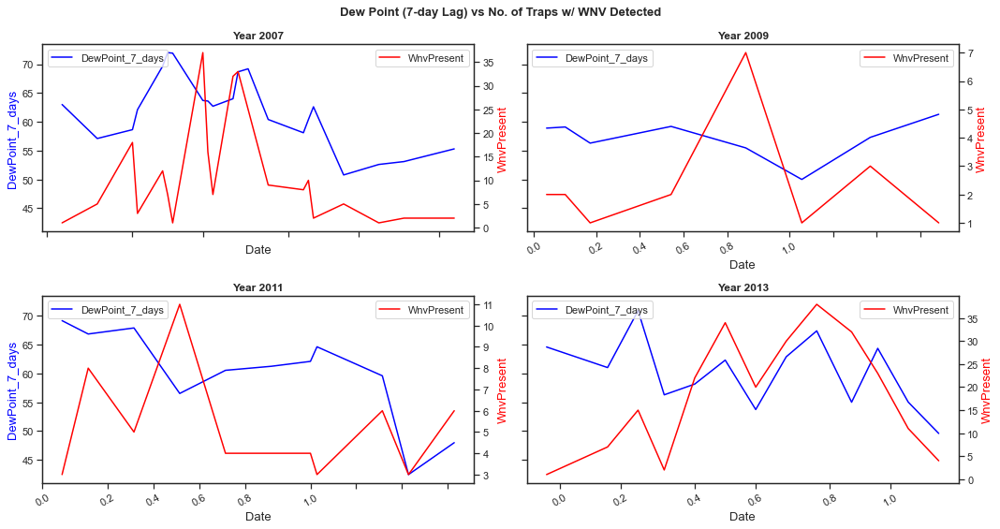

In [52]:
# yearly plots for 7-day rolling average for Dew Point

lineplot('DewPoint_7_days', "Dew Point (7-day Lag)", 30) 

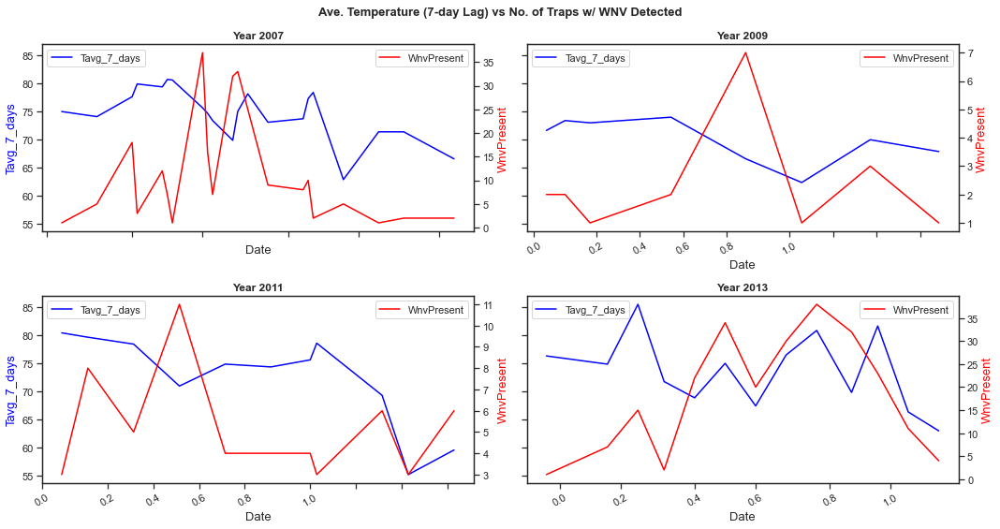

In [53]:
# yearly plots for 7-day rolling average for temperature

lineplot('Tavg_7_days', "Ave. Temperature (7-day Lag)", 30) 

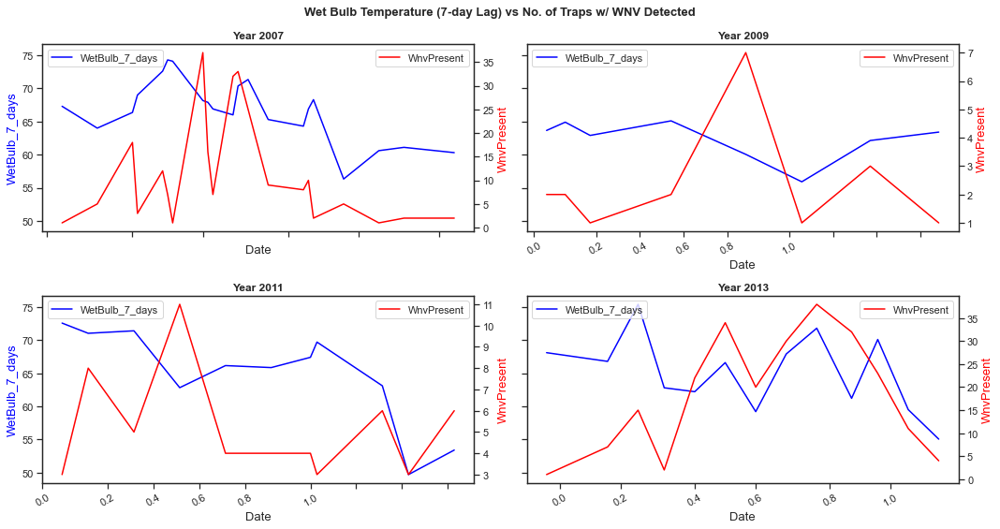

In [54]:
# yearly plots for 7-day rolling average for Wet Bulb

lineplot('WetBulb_7_days', "Wet Bulb Temperature (7-day Lag)", 30) 

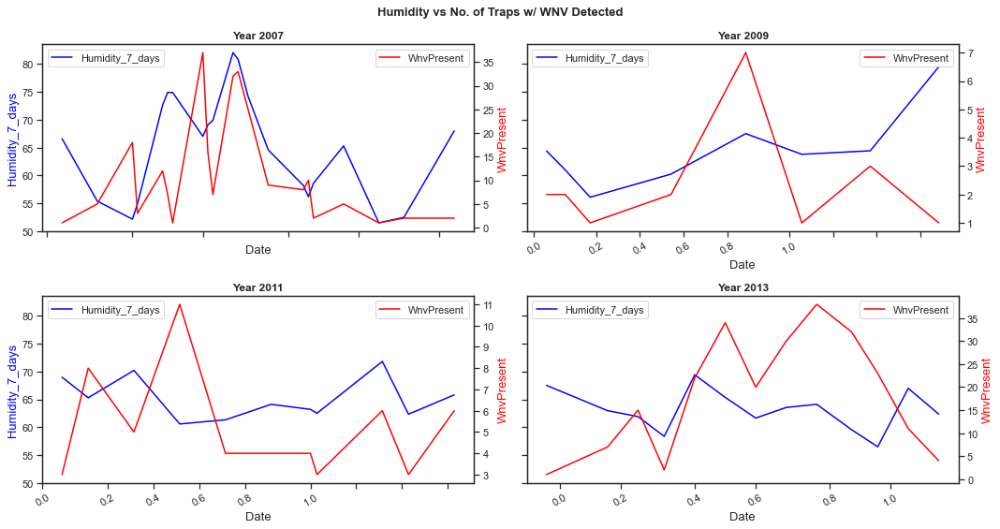

In [55]:
# yearly plots for 7-day rolling average for humidity

lineplot('Humidity_7_days', "Humidity", 30) 

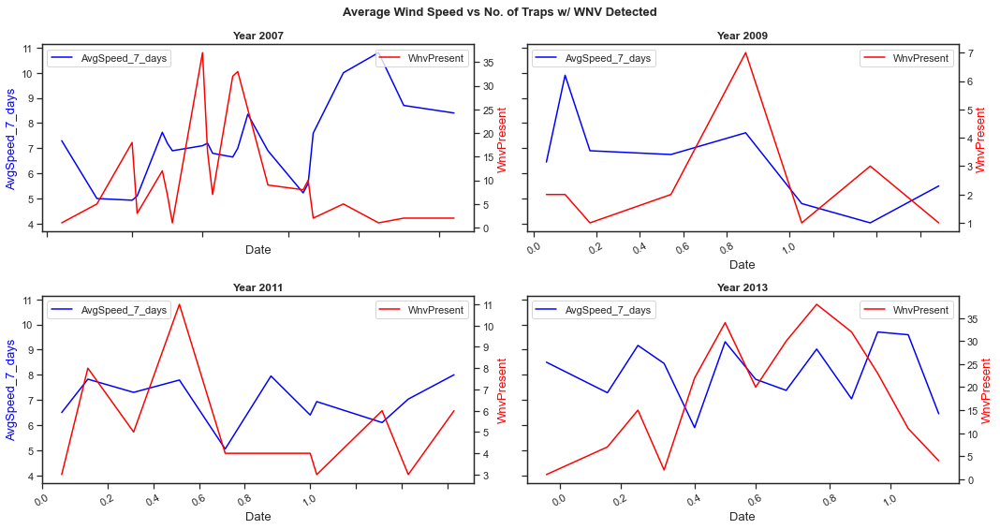

In [56]:
# yearly plots for average wind speed

lineplot('AvgSpeed_7_days', "Average Wind Speed", 30)

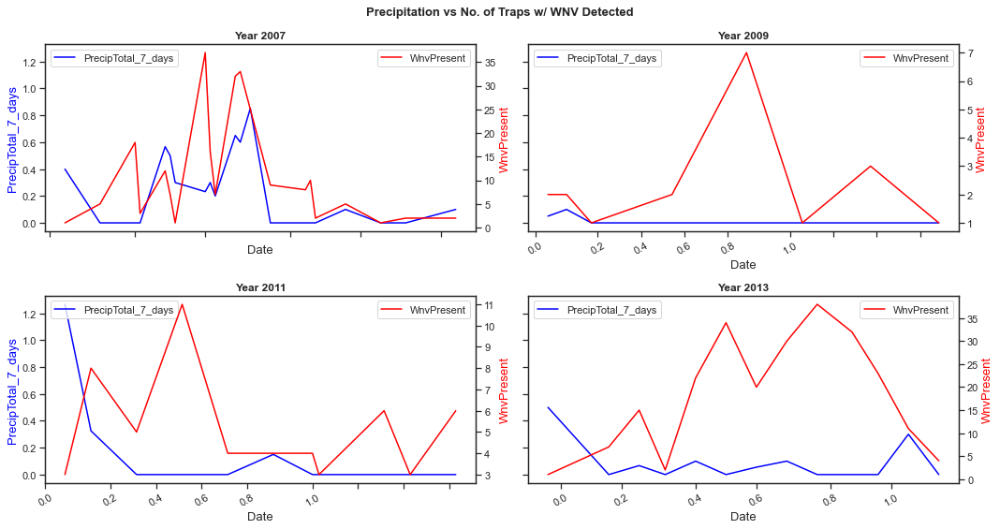

In [57]:
# yearly plots for precipitation

lineplot('PrecipTotal_7_days', "Precipitation", 30)

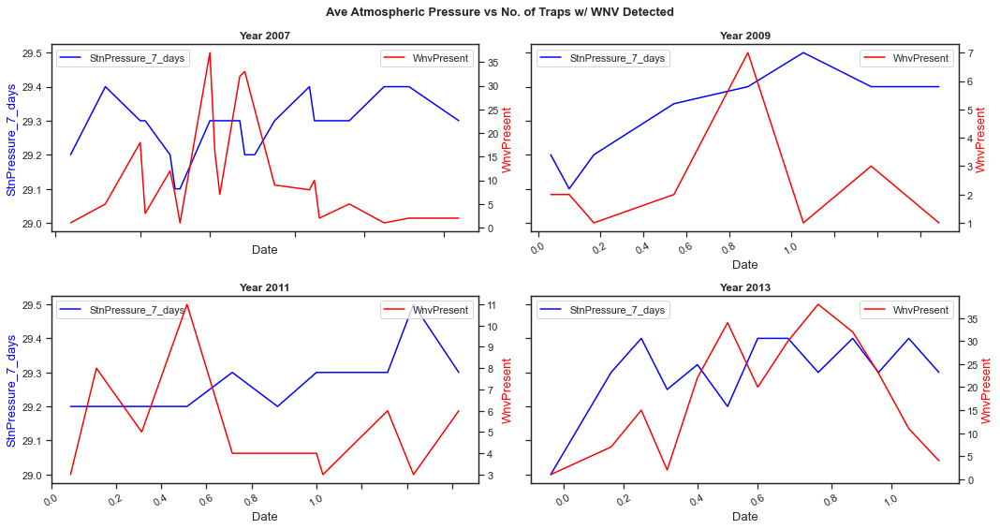

In [58]:
# yearly plots for atmospheric pressure

lineplot('StnPressure_7_days', "Ave Atmospheric Pressure", 30)

For the analysis of the line charts above, we will focus on the data for Year 2007 and Year 2013 as the volume of data for WNV-infected mosquitoes is larger. Due to the small sample of WNV-infected mosquitoes, it is less meaningful to analyse the dataset on its own.

Based on the line plots above,

1. The WNV-infected mosquito count seems to follow a direct relationship with `DewPoint`, average temperature (`Tavg`), `WetBulb` and `Humidity` variables. Slight inverse relationship is observed between the infected mosquito count and the average wind speed (`AvgSpeed`).
2. Interestingly, the mosquito count did not follow the `PrecipTotal` lines that measures daily rainfall. There are more infected mosquitoes when the 7-day rolling average rainfall is lower. Higher rainfall may disrupt the breeding grounds of mosquitoes as stale water with mosquito eggs and larvae may be washed away thus resulting in lower mosquito population for that period.
3. The atmospheric pressure did not show much relationship with the presence of infected mosquitoes.

Text(0.5, 1.0, 'Relationship bet. Humidity & Traps w/ WNV-infected Mosquitoes')

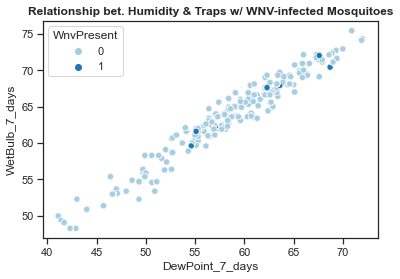

In [59]:
# Plot 7-day rolling average for Wet Bulb and Dew Point

sns.scatterplot(data=df_merged, x="DewPoint_7_days", y="WetBulb_7_days", hue="WnvPresent")
plt.title(f'Relationship bet. Humidity & Traps w/ WNV-infected Mosquitoes', fontweight='bold')

Increase in humidity increases the dew point and wet bulb temperatures. In this plot for Wet Bulb and Dew Point, we can see that the virus is present when the figures are higher on both axes. These show that higher humidity factors are more conducive for mosquitoes to breed.

Text(0.5, 1.0, 'Relationship bet. Sea Level Pressure, Average Atmospheric Pressure & \n Traps w/ WNV-infected Mosquitoes')

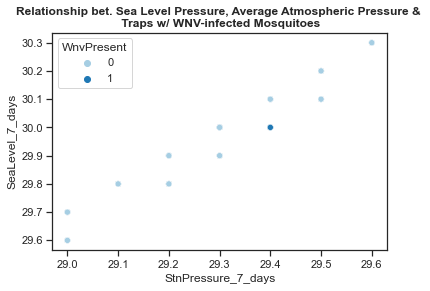

In [60]:
# Plot 7-day rolling average for sea level pressure against the station pressure

sns.scatterplot(data=df_merged, x="StnPressure_7_days", y="SeaLevel_7_days", hue="WnvPresent")
plt.title(f'Relationship bet. Sea Level Pressure, Average Atmospheric Pressure & \n Traps w/ WNV-infected Mosquitoes', fontweight='bold')

When we plotted the 7-day sea level pressure rolling average against the atmospheric pressure, we can only see one plot for positive virus presence. This chart is not very meaningful for our interpretation, an indication that these variables may not be influential in the modeling process.

Text(0.5, 1.0, 'Relationship bet. Max Temp, Mean Temp & Traps w/ WNV-infected Mosquitoes')

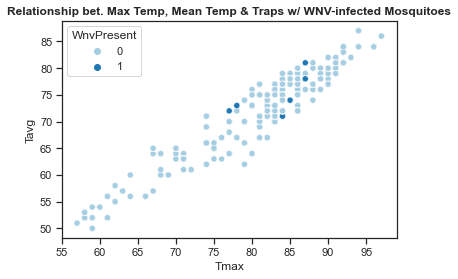

In [61]:
# Plot the average temperature against the maximum temperature

sns.scatterplot(data=df_merged, x="Tmax", y="Tavg", hue="WnvPresent")
plt.title(f'Relationship bet. Max Temp, Mean Temp & Traps w/ WNV-infected Mosquitoes', fontweight='bold')

Text(0.5, 1.0, 'Relationship bet. Max Temp, Mean Temp & \n Traps w/ WNV-infected Mosquitos')

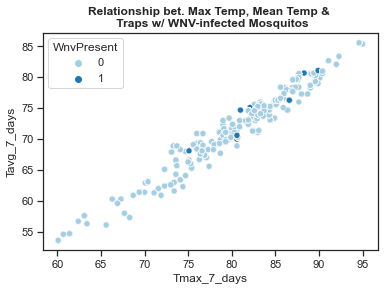

In [62]:
# Plot the 7-day rolling temperature average against the maximum temperature

sns.scatterplot(data=df_merged, x="Tmax_7_days", y="Tavg_7_days", hue="WnvPresent")
plt.title(f'Relationship bet. Max Temp, Mean Temp & \n Traps w/ WNV-infected Mosquitos', fontweight='bold')

Based on the two temperature scatter plots above, 
1. We see WNV-infected mosquito present as the temperature increases.
2. The ideal temperature for mosquito to breed and live lies between average daily temperatures of 65F and 80F.

### Heatplot Map to Check for Collinearity

In [63]:
# Check for column info and data types

df_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10506 entries, 0 to 10505
Data columns (total 86 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Date                 10506 non-null  datetime64[ns]
 1   Species              10506 non-null  object        
 2   Trap                 10506 non-null  object        
 3   Latitude             10506 non-null  float64       
 4   Longitude            10506 non-null  float64       
 5   AddressAccuracy      10506 non-null  int64         
 6   NumMosquitos         10506 non-null  int64         
 7   WnvPresent           10506 non-null  int64         
 8   Year                 10506 non-null  int64         
 9   Month                10506 non-null  int64         
 10  Week                 10506 non-null  int64         
 11  DayOfWeek            10506 non-null  int64         
 12  Station              10506 non-null  float64       
 13  Tmax                 10506 non-

In [64]:
# List features to map

features1 = ['NumMosquitos', 'WnvPresent','Station', 'Tmax', 'Tmin', 'Tavg', 'Depart',
       'DewPoint', 'WetBulb', 'Heat', 'Cool', 'Sunrise', 'Sunset', 'CodeSum',
       'PrecipTotal', 'StnPressure', 'SeaLevel', 'ResultSpeed', 'ResultDir',
       'AvgSpeed', 'Sunrise_1', 'Sunset_1', 'daylight_duration', 'Humidity',
       'Tavg_7_days', 'Depart_7_days', 'DewPoint_7_days', 'WetBulb_7_days',
       'Heat_7_days', 'Cool_7_days', 'Sunrise_7_days', 'Sunset_7_days', 'PrecipTotal_7_days', 'StnPressure_7_days',
       'SeaLevel_7_days', 'ResultSpeed_7_days', 'ResultDir_7_days',
       'AvgSpeed_7_days', 'Humidity_7_days', 'Longitude', 'Latitude']

<AxesSubplot:>

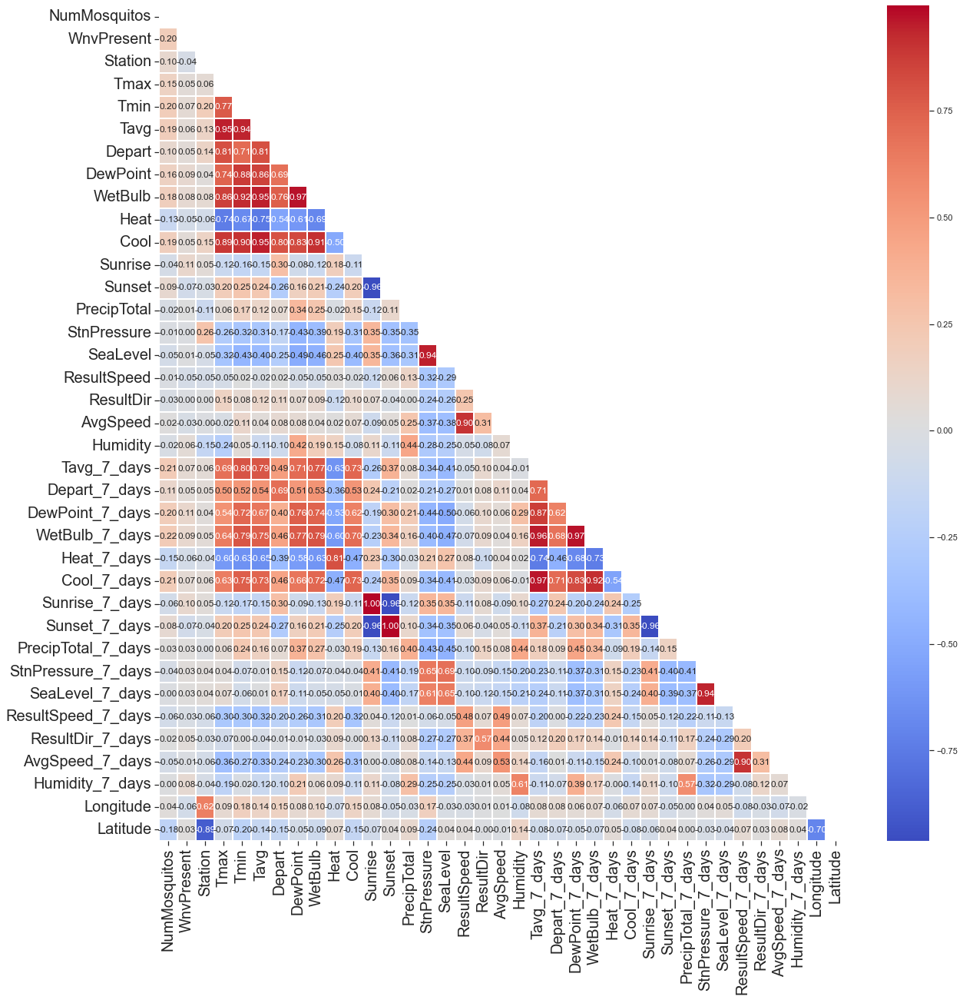

In [65]:
#heatmap for non-object features

mask = np.zeros_like(df_merged[features1].corr())
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize=(20,20))
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
sns.heatmap(
    df_merged[features1].corr(),
    cmap='coolwarm',
    annot=True,
    fmt = ".2f",
    mask = mask,
    linewidth = 0.3)

Based on the heatmap above, 

1. At first glance, we don't see many variables that are correlated to the presence of WNV.
2. However we do see a number of highly correlated features which could be related to each other. We did not drop these features as we intend to deploy Principal Component Analysis (PCA) to select the more important variables to be used within our prediction model.

### Spatial Data of Mosquito and Infection Hotspots, and Spraying Efforts

In [71]:
# select columns for analysis

loc_df = train_df[['Trap', 'Street', 'Species', 'WnvPresent']]

In [72]:
# view the first five rows

loc_df.head()

,Trap,Street,Species,WnvPresent
0,T002,N OAK PARK AVE,CULEX PIPIENS/RESTUANS,0
1,T002,N OAK PARK AVE,CULEX RESTUANS,0
2,T007,N MANDELL AVE,CULEX RESTUANS,0
3,T015,W FOSTER AVE,CULEX PIPIENS/RESTUANS,0
4,T015,W FOSTER AVE,CULEX RESTUANS,0


In [73]:
# list of traps

loc_df['Trap'].unique()

array(['T002', 'T007', 'T015', 'T045', 'T046', 'T048', 'T049', 'T050',
       'T054', 'T086', 'T091', 'T094', 'T096', 'T129', 'T143', 'T148',
       'T153', 'T159', 'T009', 'T011', 'T016', 'T019', 'T025', 'T028',
       'T031', 'T033', 'T089', 'T090', 'T092', 'T135', 'T141', 'T142',
       'T145', 'T146', 'T147', 'T149', 'T150', 'T151', 'T152', 'T154',
       'T158', 'T162', 'T218', 'T220', 'T001', 'T003', 'T006', 'T008',
       'T012', 'T034', 'T037', 'T040', 'T043', 'T047', 'T051', 'T085',
       'T088', 'T161', 'T219', 'T013', 'T014', 'T018', 'T030', 'T084',
       'T144', 'T160', 'T005', 'T017', 'T044', 'T095', 'T004', 'T035',
       'T036', 'T039', 'T060', 'T061', 'T062', 'T065', 'T066', 'T067',
       'T069', 'T070', 'T071', 'T073', 'T074', 'T075', 'T076', 'T077',
       'T079', 'T080', 'T081', 'T082', 'T083', 'T114', 'T155', 'T063',
       'T115', 'T138', 'T200', 'T206', 'T209', 'T212', 'T215', 'T107',
       'T128', 'T072', 'T078', 'T097', 'T099', 'T100', 'T102', 'T103',
      

In [74]:
# set parameters

params = ['T002', 'T007', 'T015', 'T045', 'T046', 'T048', 'T049', 'T050',
       'T054', 'T086', 'T091', 'T094', 'T096', 'T129', 'T143', 'T148',
       'T153', 'T159', 'T009', 'T011', 'T016', 'T019', 'T025', 'T028',
       'T031', 'T033', 'T089', 'T090', 'T092', 'T135', 'T141', 'T142',
       'T145', 'T146', 'T147', 'T149', 'T150', 'T151', 'T152', 'T154',
       'T158', 'T162', 'T218', 'T220', 'T001', 'T003', 'T006', 'T008',
       'T012', 'T034', 'T037', 'T040', 'T043', 'T047', 'T051', 'T085',
       'T088', 'T161', 'T219', 'T013', 'T014', 'T018', 'T030', 'T084',
       'T144', 'T160', 'T005', 'T017', 'T044', 'T095', 'T004', 'T035',
       'T036', 'T039', 'T060', 'T061', 'T062', 'T065', 'T066', 'T067',
       'T069', 'T070', 'T071', 'T073', 'T074', 'T075', 'T076', 'T077',
       'T079', 'T080', 'T081', 'T082', 'T083', 'T114', 'T155', 'T063',
       'T115', 'T138', 'T200', 'T206', 'T209', 'T212', 'T215', 'T107',
       'T128', 'T072', 'T078', 'T097', 'T099', 'T100', 'T102', 'T103',
       'T027', 'T156', 'T157', 'T221', 'T900', 'T903', 'T222', 'T223',
       'T225', 'T227', 'T224', 'T226', 'T229', 'T230', 'T228', 'T232',
       'T231', 'T235', 'T233', 'T236', 'T237', 'T238', 'T094B', 'T054C']

In [75]:
# print out street location of traps

for value in params:
    df_name = 'df' + value
    df_name = loc_df[loc_df['Trap'] == value]
    print(f"{df_name.iloc[0]['Trap']} is located in {df_name.iloc[0]['Street']}")

T002 is located in  N OAK PARK AVE
T007 is located in  N MANDELL AVE
T015 is located in  W FOSTER AVE
T045 is located in  W WEBSTER AVE
T046 is located in  W GRAND AVE
T048 is located in  W ROOSEVELT
T049 is located in  W CHICAGO
T050 is located in  N STAVE ST
T054 is located in  N CANNON DR
T086 is located in  W 113TH ST
T091 is located in  S PEORIA ST
T094 is located in  W 95TH ST
T096 is located in  W 89TH ST
T129 is located in  N STREETER DR
T143 is located in  N OAK PARK AVE
T148 is located in  N OAKLEY AVE
T153 is located in  N LONG AVE
T159 is located in  S CARPENTER ST
T009 is located in  W HIGGINS AVE
T011 is located in  N PITTSBURGH AVE
T016 is located in  N OKETO AVE
T019 is located in  N CALIFORNIA AVE
T025 is located in  W BALMORAL AVE
T028 is located in  N WESTERN AVE
T031 is located in  S CENTRAL AVE
T033 is located in  N HUMBOLDT DR
T089 is located in  S VINCENNES
T090 is located in  S ASHLAND AVE
T092 is located in  S STATE ST
T135 is located in  W 127TH PL
T141 is loc

In [76]:
# to identify the max latitude and longitude

print(f"Latitude max is: {df_merged[['Latitude']].max()}")
print(f"Latitude min is: {df_merged[['Latitude']].min()}")
print("")
print(f"Longitude max is: {df_merged[['Longitude']].max()}")
print(f"Longitude min is: {df_merged[['Longitude']].min()}")

Latitude max is: Latitude    42.01743
dtype: float64
Latitude min is: Latitude    41.644612
dtype: float64

Longitude max is: Longitude   -87.531635
dtype: float64
Longitude min is: Longitude   -87.930995
dtype: float64


In [77]:
# Set the boundary box for map (must be slightly more than the max and minimum)

bbox = (-88, -87.5, 41.6, 42.1)

In [78]:
# Obtain only columns Longitude and Latitude

traps = df_merged[['Longitude','Latitude']].drop_duplicates().values

In [80]:
sprays = df_spray[['Longitude', 'Latitude']].drop_duplicates().values

In [88]:
# Define function to plot mat
def plot_map (df, color, shape, title):
    plt.figure(figsize=(15,15)) # Figure size
    plt.title(title) # Title of the map
    plt.imshow(mapdata, # Load mapdata
          cmap=plt.get_cmap('gray'), # Set color of map
          extent=bbox, # Set BBox
          );
    plt.scatter(df[:,0], df[:,1], c= color, marker=shape, alpha=1) # Load dataset, set marker to a shape

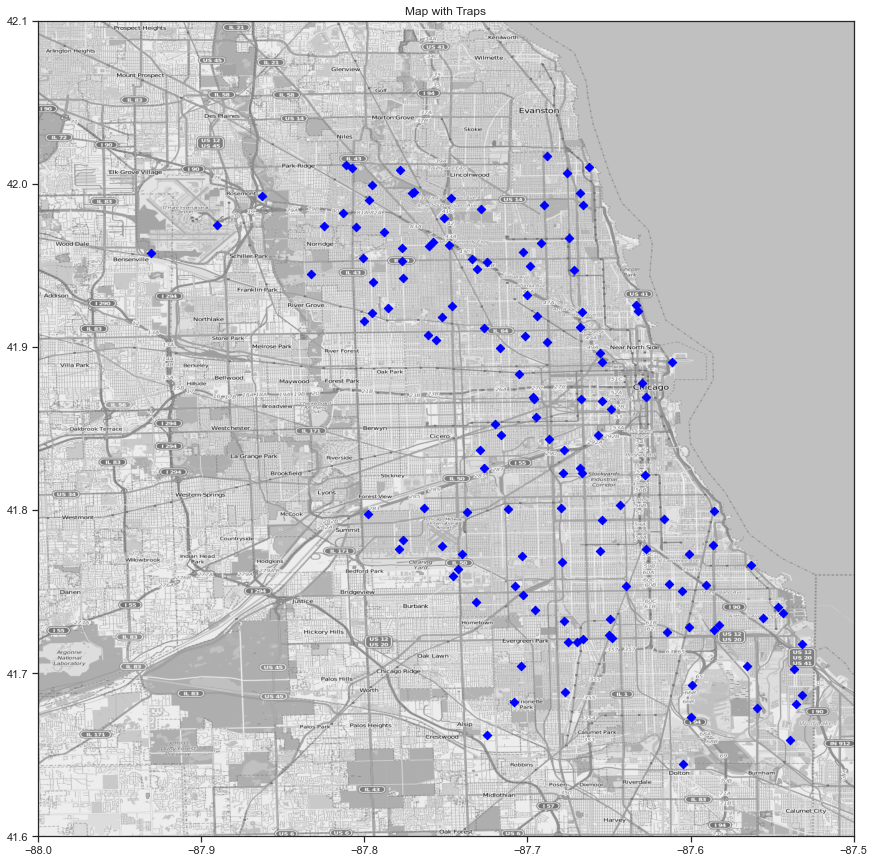

In [91]:
plot_map(traps, "blue", 'D', 'Map with Traps') # Traps are shown with Diamond markers

The distribution of traps changed over the years of 2007 to 2013. The map above contains the consolidated trap locations across the years.

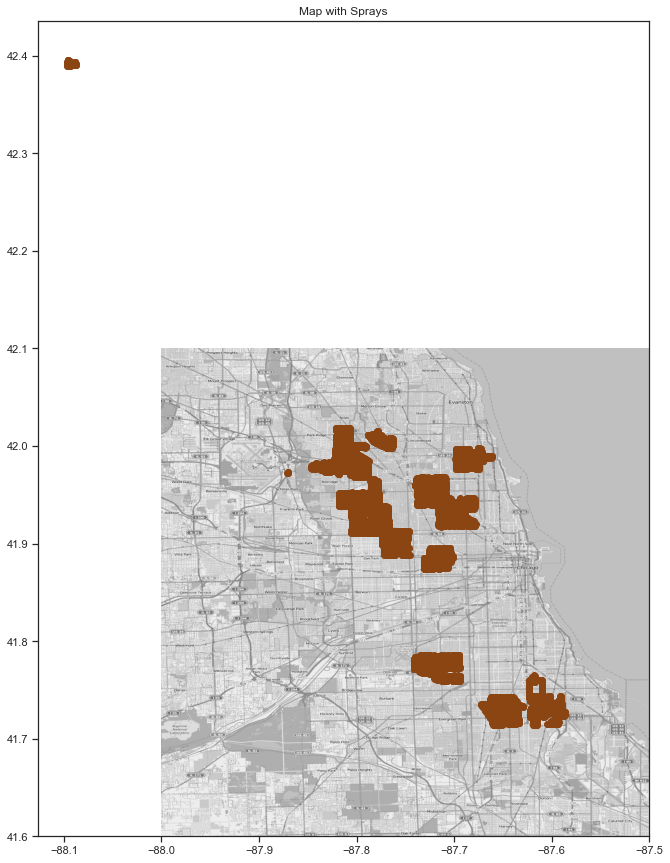

In [90]:
plot_map(sprays, 'saddlebrown', None, 'Map with Sprays')

In this chart, we see an outlier for spray location found outside the map.txt data, likely outside the city limit area. This is likely irrelevant to the study and will be removed.

In [93]:
sprays_1 = df_spray[(df_spray['Latitude'] < 42.1)] # Remove the outlier
sprays_1 = sprays_1[['Longitude', 'Latitude']].values

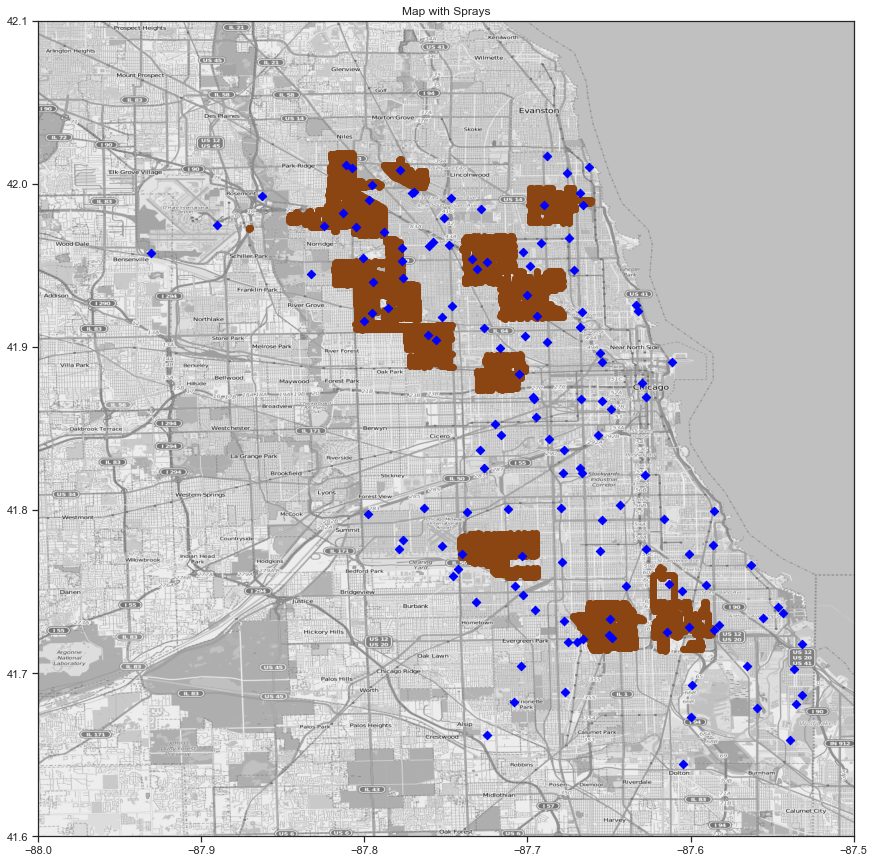

In [96]:
# plot map with traps and spray locations
plt.figure(figsize=(15,15))
plt.title('Map with Sprays')
plt.imshow(mapdata,
          cmap=plt.get_cmap('gray'),
          extent=bbox,
          );

plt.scatter(sprays_1[:,0], sprays_1[:,1], c='saddlebrown', alpha=1)
plt.scatter(traps[:,0], traps[:,1], marker='D', c='blue', alpha=1)

Above is the consolidated spray data of 2011 and 2013 with trap locations. We'll isolate the spray data according to the separate years so we can better assess the location of spray.

In [99]:
# set up data for 2011

df_spray['Date'] = pd.to_datetime(df_spray['Date'])
spray2011 = df_spray[(df_spray['Date'].dt.year == 2011) & (df_spray['Latitude'] < 42.1)]
spray2011 = pd.DataFrame(spray2011, columns = ['Longitude','Latitude'])
spray2011 = spray2011[['Longitude', 'Latitude']].values

In [105]:
# set up data for 2013

df_spray['Date'] = pd.to_datetime(df_spray['Date'])
spray2013 = df_spray[(df_spray['Date'].dt.year == 2013) & (df_spray['Latitude'] < 42.1)]
spray2013 = pd.DataFrame(spray2013, columns = ['Longitude','Latitude'])
spray2013 = spray2013[['Longitude', 'Latitude']].values

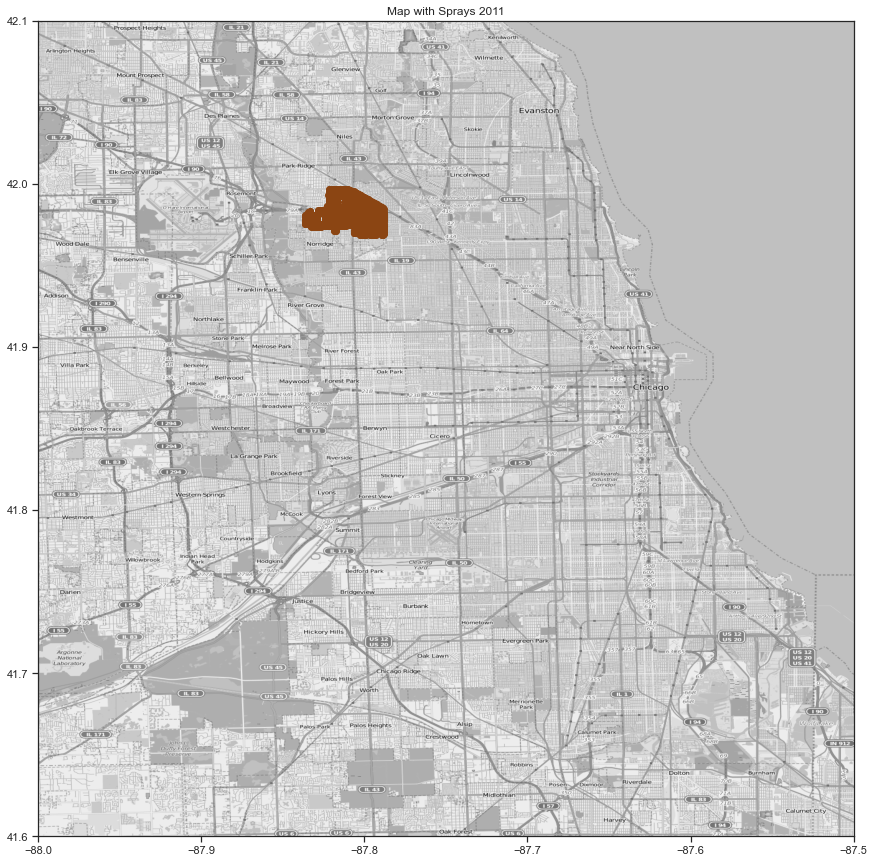

In [100]:
#plot spray map for 2011

plot_map(spray2011, 'saddlebrown', None, 'Map with Sprays 2011')

In 2011, the spraying efforts were done around the north side, near Jefferson Park area.

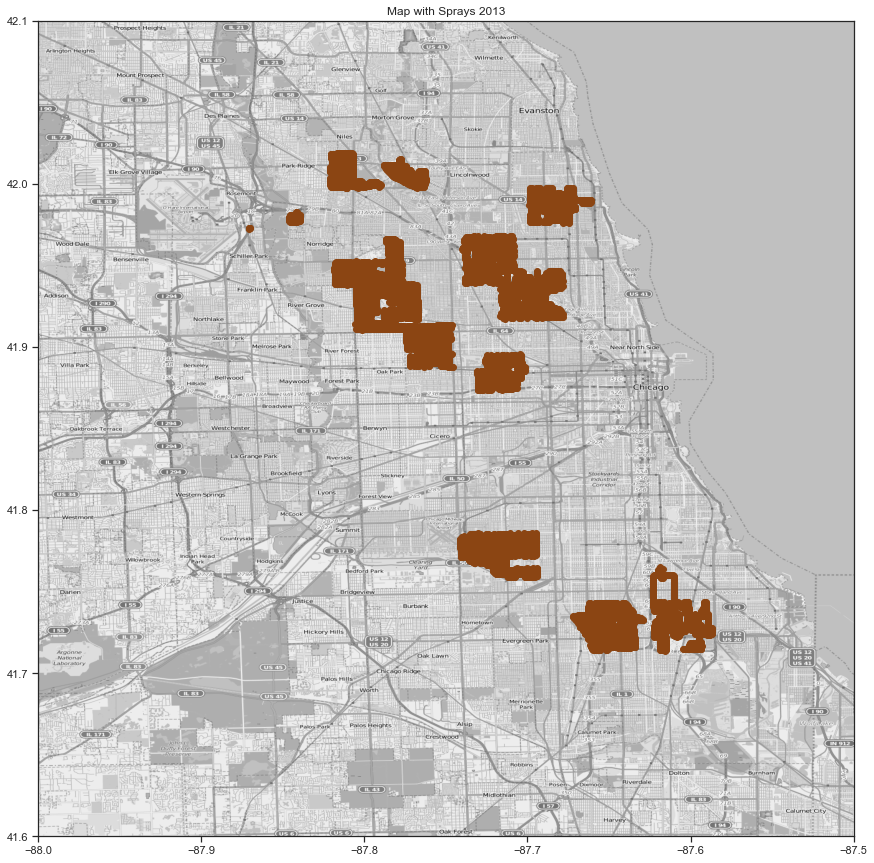

In [106]:
# plot spray map for 2013

plot_map(spray2013, 'saddlebrown', None, 'Map with Sprays 2013')

Meanwhile in 2013, spraying was more spread out around:
- Far north side: Norwood Park, Jefferson Park area
- North side: Avondale, Logan Square, Lakeview
- West side: West Town, Near West side, Lower West Side
- Southwest side: Gage Park area
- Far southwest side: Auburn Gresham
- Far southeast side: near Roseland, Pullman, Calumet Heights and South Deering

We will now deploy Kernel Density to look into the weight of traps with mosquitos with WNV present across the years to identify approximate locations where the virus were detected.

In [107]:
# function for plotting kernel density

def kernel_density(df, title, palette):
    color = plt.get_cmap(palette)
    color._init()
    color._lut[:-3,-1] = abs(np.logspace(0, 1, color.N) / 10 - 1)[::-1]
    # set aspect
    aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
    # fit kernel density onto spray locations
    kd = KernelDensity(bandwidth=0.015)
    kd.fit(df)

    kd_x, kd_y = np.meshgrid(np.linspace(-88, -87.5, 100), np.linspace(41.6, 42.1, 100))
    gridpoints = np.array([kd_x.ravel(),kd_y.ravel()]).T
    kd_z = np.exp(kd.score_samples(gridpoints).reshape(100,100))

    # plot kernel density
    plt.figure(figsize=(10,14))
    plt.imshow(mapdata, cmap=plt.get_cmap('gray'), extent=bbox, aspect=aspect)
    plt.imshow(kd_z, origin='lower', cmap=color, extent=bbox, aspect=aspect)
    plt.scatter(traps[:,0], traps[:,1], color = 'r', marker='D', alpha=1)
    plt.title(title)
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')

In [113]:
df_merged['Date'] = pd.to_datetime(df_merged['Date'])

In [119]:
# to identify trap with highest infected numbers (2007)

df2007 = df_merged[(df_merged['Date'].dt.year == 2007) & (df_merged['WnvPresent'] == 1 )]
print(f'Highest WNV present trap is {df2007.Trap.mode()}')
df2007 = pd.DataFrame(df2007, columns = ['Longitude','Latitude'])
df2007 = df2007[['Longitude', 'Latitude']].values

Highest WNV present trap is 0    T115
Name: Trap, dtype: object


In [121]:
# to identify trap with highest infected numbers (2009)

df2009 = df_merged[(df_merged['Date'].dt.year == 2009) & (df_merged['WnvPresent'] == 1 )]
print(f'Highest WNV present trap is {df2009.Trap.mode()}')
df2009 = pd.DataFrame(df2009, columns = ['Longitude','Latitude'])
df2009 = df2009[['Longitude', 'Latitude']].values

Highest WNV present trap is 0    T095
1    T900
2    T903
Name: Trap, dtype: object


In [122]:
# to identify trap with highest infected numbers (2011)

df2011 = df_merged[(df_merged['Date'].dt.year == 2011) & (df_merged['WnvPresent'] == 1 )]
print(f'Highest WNV present trap is {df2011.Trap.mode()}')
df2011 = pd.DataFrame(df2011, columns = ['Longitude','Latitude'])
df2011 = df2011[['Longitude', 'Latitude']].values

Highest WNV present trap is 0    T900
Name: Trap, dtype: object


In [124]:
# to identify trap with highest infected numbers (2013)

df2013 = df_merged[(df_merged['Date'].dt.year == 2013) & (df_merged['WnvPresent'] == 1 )]
print(f'Highest WNV present trap is {df2013.Trap.mode()}')
df2013 = pd.DataFrame(df2013, columns = ['Longitude','Latitude'])
df2013 = df2013[['Longitude', 'Latitude']].values

Highest WNV present trap is 0    T900
Name: Trap, dtype: object


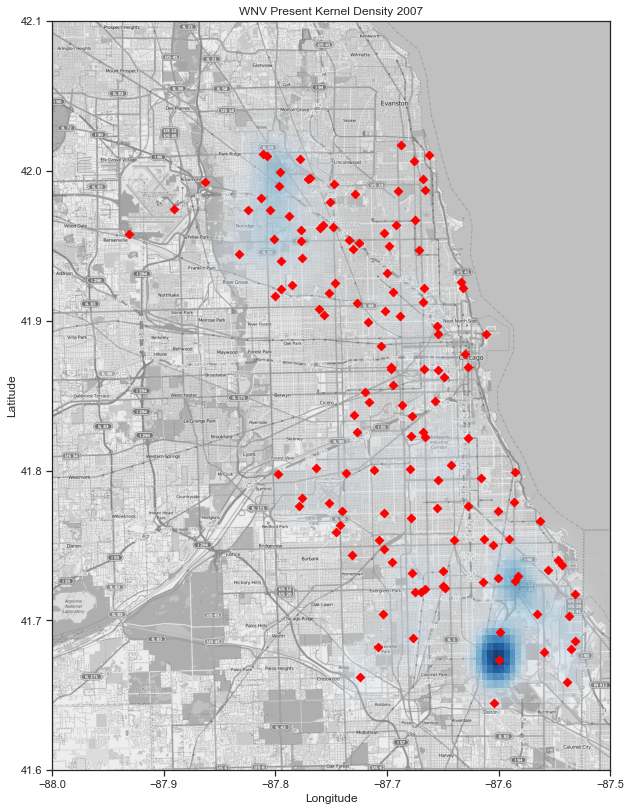

In [125]:
# WnvPresent density plot for 2007

kernel_density(df2007, 'WNV Present Kernel Density 2007', 'Blues')

In 2007, Trap 115 was found to have the highest count of WNV-infected mosquitoes. There is one major hot spot observed in South Doty Avenue.

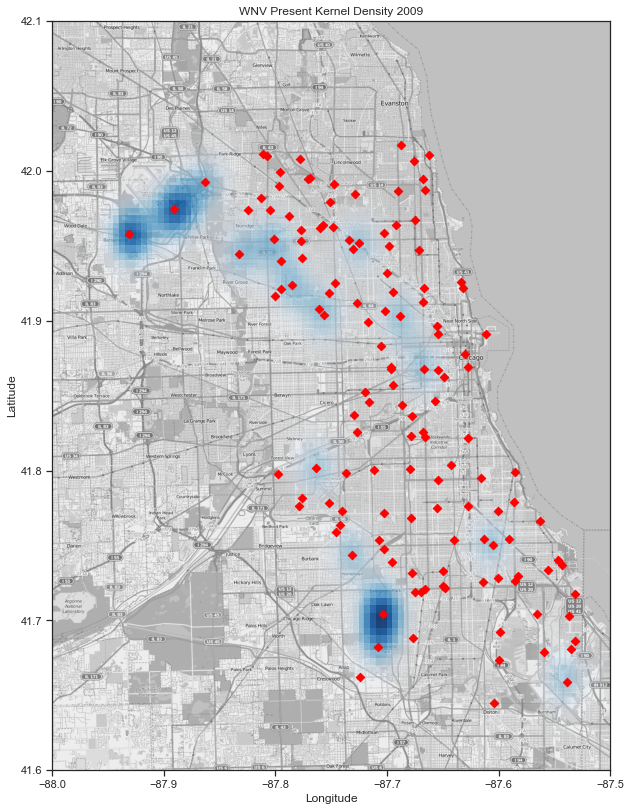

In [126]:
# WnvPresent density plot for 2009

kernel_density(df2009, 'WNV Present Kernel Density 2009', 'Blues')

In 2009, Trap 95 was found to have the highest count of WNV-infected mosquitos. There are three hot spots observed: 
- Northwest - W O'Hare, O'Hare Airport
- South - South Kedzie Ave

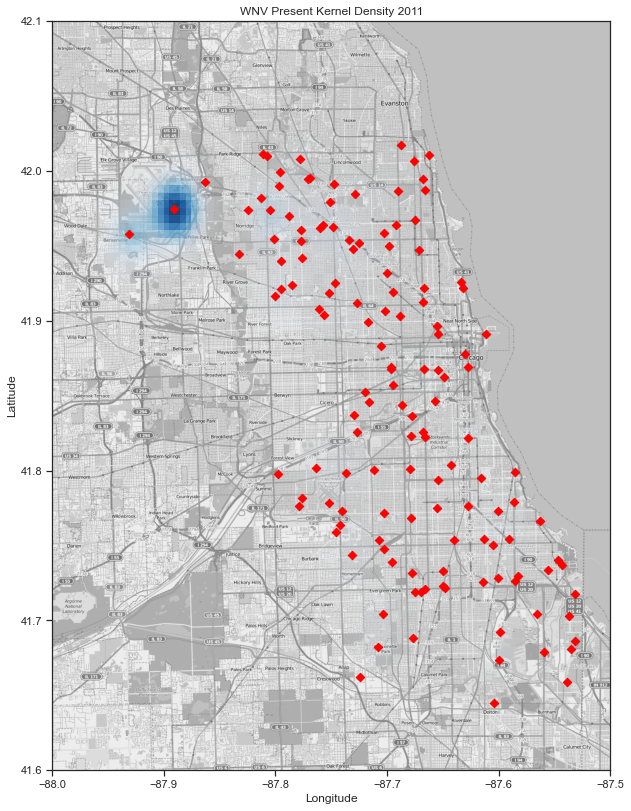

In [127]:
# WnvPresent density plot for 2011

kernel_density(df2011, 'WNV Present Kernel Density 2011', 'Blues')

In 2011, Trap 900 was found to have the highest count of WNV-infected mosquitoss. There is one hot spot observed in near O'Hare International Airport.

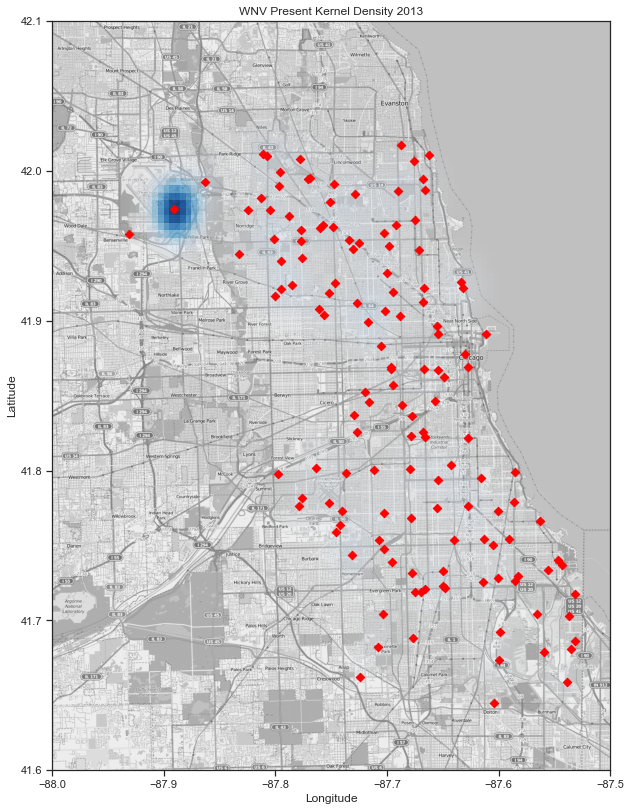

In [128]:
# WnvPresent density plot for 2013

kernel_density(df2013, 'WNV Present Kernel Density 2013', 'Blues')

In 2013, Trap 900 was found to have the highest count of WNV-infected mosquitoes O'Hare International Airport - similar to the one identified in 2009 and 2011. 

Text(0, 0.5, 'Latitude')

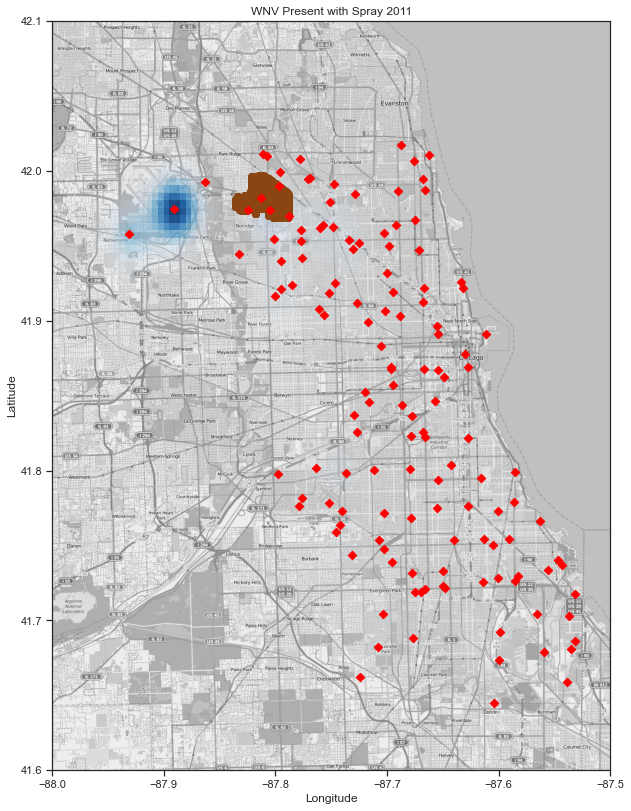

In [129]:
# combined map of WnvPresent hotspot, trap locations and spray locations for 2011

color = plt.get_cmap('Blues')
color._init()
color._lut[:-3,-1] = abs(np.logspace(0, 1, color.N) / 10 - 1)[::-1]
# set aspect
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
# fit kernel density onto spray locations
kd = KernelDensity(bandwidth=0.015)
kd.fit(df2011)

spray_x, spray_y = np.meshgrid(np.linspace(-88, -87.5, 100), np.linspace(41.6, 42.1, 100))
gridpoints = np.array([spray_x.ravel(),spray_y.ravel()]).T
spray_z = np.exp(kd.score_samples(gridpoints).reshape(100,100))

# plot kernel density
plt.figure(figsize=(10,14))
plt.imshow(mapdata, cmap=plt.get_cmap('gray'), extent=bbox, aspect=aspect)
plt.imshow(spray_z, origin='lower', cmap=color, extent=bbox, aspect=aspect)
plt.scatter(spray2011[:,0], spray2011[:,1], c='saddlebrown', alpha=1)
plt.scatter(traps[:,0], traps[:,1], color = 'r', marker='D', alpha=1)
plt.title('WNV Present with Spray 2011')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

In 2011, the spray was done around Jefferson Park area (in brown) while the hot spot is near O'Hare International Airport. When we looked at Google Map, we noticed that these area is around 6.9 miles away from each other (10 minutes drive). Jefferson Park appears to be a residential area which explains why the spray is done there instead of the airport area. 

Text(0, 0.5, 'Latitude')

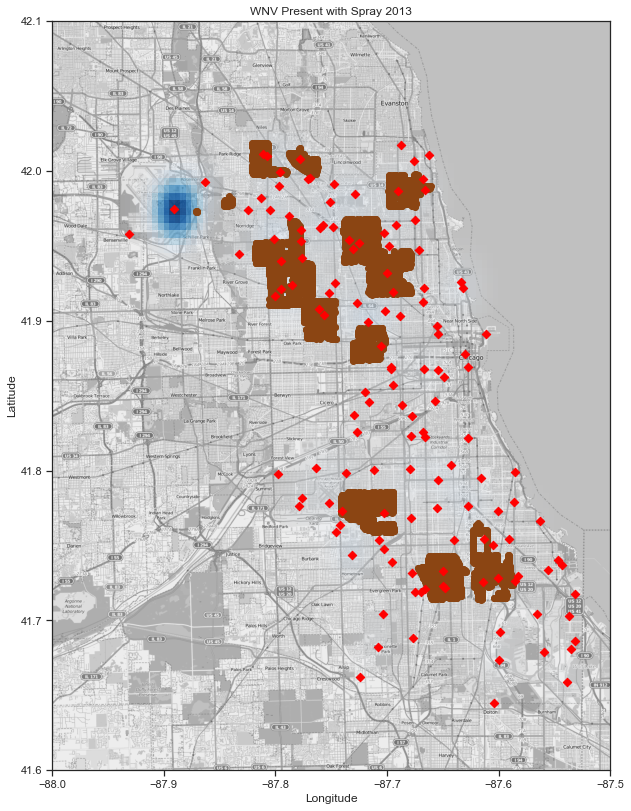

In [130]:
# combined map of WnvPresent hotspot, trap locations and spray locations for 2013
color = plt.get_cmap('Blues')
color._init()
color._lut[:-3,-1] = abs(np.logspace(0, 1, color.N) / 10 - 1)[::-1]
# set aspect
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
# fit kernel density onto spray locations
kd = KernelDensity(bandwidth=0.015)
kd.fit(df2013)

spray_x, spray_y = np.meshgrid(np.linspace(-88, -87.5, 100), np.linspace(41.6, 42.1, 100))
gridpoints = np.array([spray_x.ravel(),spray_y.ravel()]).T
spray_z = np.exp(kd.score_samples(gridpoints).reshape(100,100))

# plot kernel density
plt.figure(figsize=(10,14))
plt.imshow(mapdata, cmap=plt.get_cmap('gray'), extent=bbox, aspect=aspect)
plt.imshow(spray_z, origin='lower', cmap=color, extent=bbox, aspect=aspect)
plt.scatter(spray2013[:,0], spray2013[:,1], c='saddlebrown', alpha=1)
plt.scatter(traps[:,0], traps[:,1], color = 'r', marker='D', alpha=1)
plt.title('WNV Present with Spray 2013')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

Meanwhile in 2013, although the hot spot remains near O'Hare International Airport, we see that more spraying efforts were done in areas nearer to the airport - specifically the north and northwest side.